In [357]:
set.seed(1234)

library("here")
library(devtools)
library(Seurat)
library(harmony)
library(RcppML)

devtools::load_all('/home/jpm73279/Socrates')
data_path <- "/scratch/jpm73279/comparative_single_cell/02.QC_clustering/oryza_sativa/QC_output/"

i Loading Socrates
Warning message:
"replacing previous import 'scales::viridis_pal' by 'viridis::viridis_pal' when loading 'Socrates'"


In [358]:
rep_1 <- paste0(data_path,"Oryza_sativa.scATAC_rep1_QC_soc_obj.rds")
rep_2 <- paste0(data_path,"Oryza_sativa.scATAC_rep2_QC_soc_obj.rds")
prefix <- "Os_leaf.merged_replicates"
#PDF_dir <- "PDF_outputs"
#dir.create(PDF_dir)

rep_1_read <- readRDS(rep_1)
rep_2_read <- readRDS(rep_2)
rep_files <- list(rep_1_read, rep_2_read)
names(rep_files) <- c("rep1", "rep2")


print("Merging Object")
merged.obj <- mergeSocratesRDS(obj.list=rep_files)


print("Generating Socrates Obj")
    ## Generate Socrates Object
soc.obj <- merged.obj




[1] "Merging Object"
[1] "Generating Socrates Obj"


In [387]:
soc.obj <- merged.obj


In [360]:
library(tidyverse)
as_tibble(merged.obj$meta)  %>% 
    group_by(sampleID)  %>% 
    summarise(mean_total = mean(total),
                           mean_tss = mean(tss),
                            mean_acrs = mean(acrs),
             mean_nSites = mean(nSites))

sampleID,mean_total,mean_tss,mean_acrs,mean_nSites
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
rep1,12402.15,4842.984,6177.355,4896.725
rep2,15094.39,5855.466,7440.672,5884.665


In [361]:
    print("Generating Graphs")
    # estimate log10 number of accessible regions per cell
    cell.counts <- Matrix::colSums(soc.obj$counts)

    # estimate peak accessibility frequency across cells
    site.freq <- Matrix::rowMeans(soc.obj$counts)

[1] "Generating Graphs"


Warning message in xy.coords(x, y, xlabel, ylabel, log):
"3 x values <= 0 omitted from logarithmic plot"
Warning message in xy.coords(x, y, xlabel, ylabel, log):
"1 x value <= 0 omitted from logarithmic plot"


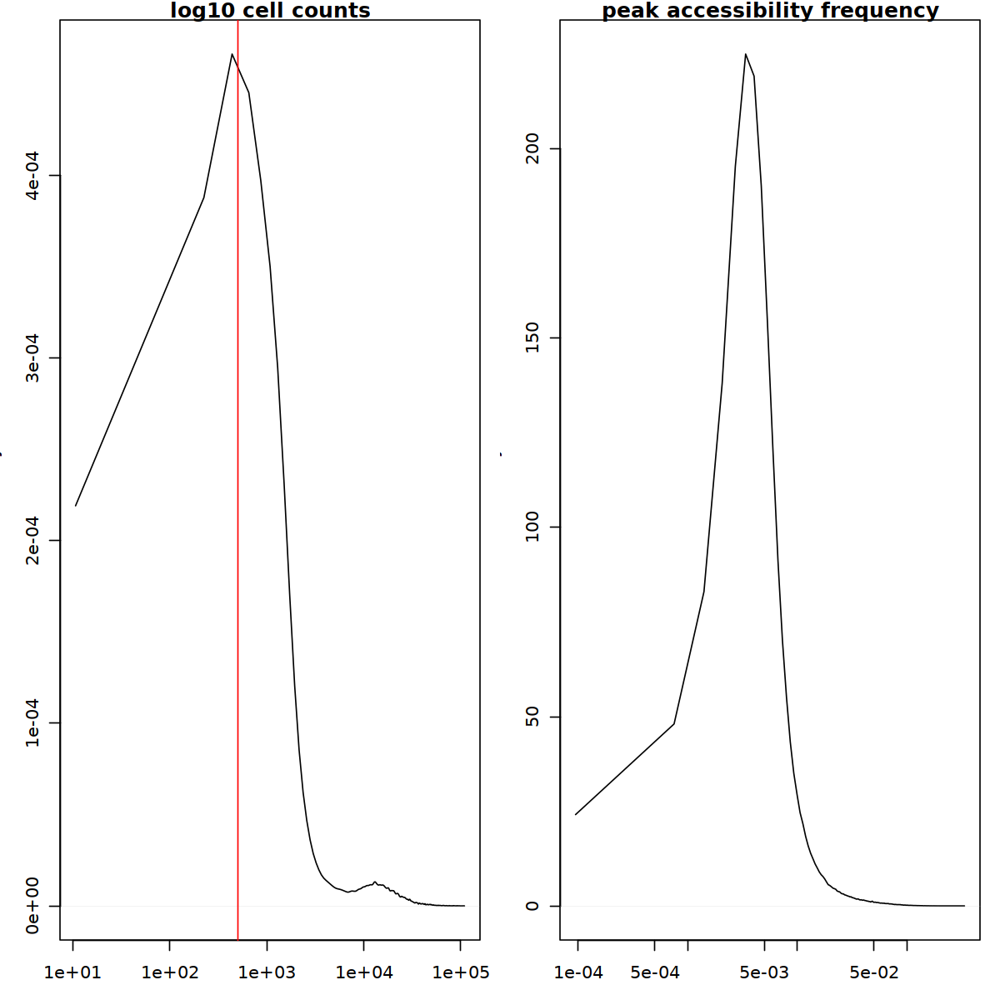

In [362]:
layout(matrix(c(1:2), ncol=2))
par(mar=c(3,3,1,1))
plot(density(cell.counts), main="log10 cell counts", log="x")
abline(v=500, col="red")
plot(density(site.freq), main="peak accessibility frequency", log="x")

In [363]:
site.freq <- Matrix::rowMeans(soc.obj$counts)

In [364]:
cell.counts.threshold

[1] 100

In [392]:
# get per cell feature counts --------------------------------------------
cell.counts <- Matrix::colSums(soc.obj$counts)  # count number of features with Tn5 insertions per cell
cell.counts.z <- as.numeric(scale(cell.counts)) # convert features counts into Z-scores
cell.counts.threshold <- max(c(cell.counts[cell.counts.z < -1], 100)) # minimum feature counts (greater of 1 std or 1000)


# clean sparse counts matrix ---------------------------------------------
soc.obj <- cleanData(soc.obj, 
                     min.c=400,  # minimum number of accessible features per cell
                     min.t=0.015,  # minimum feature frequency across cells
                     max.t=0.2, # maximum feature frequency across cells
                     verbose=T)

   * Input: cells = 34909 | peaks = 654529

   * Filtered: cells = 12718 | peaks = 52333



In [393]:
# normalize with TFIDF ---------------------------------------------------
soc.obj <- tfidf(soc.obj,
                doL2=T)

In [394]:
# project with NMF -------------------------------------------------------
soc.obj.reduce_dim <- reduceDims(soc.obj,
                      method="SVD", 
                      cor.max=.5,
                      n.pcs=30, 
                      svd_slotName="SVD")


# reduce to 2-dimensions with UMAP ---------------------------------------
soc.obj.project_umap <- projectUMAP(soc.obj.reduce_dim, 
                       verbose=T,
                       k.near=25,
                       m.dist=0.01,
                       svd_slotName="SVD")

 - non-linear dimensionality reduction with UMAP ...

12:13:36 UMAP embedding parameters a = 1.896 b = 0.8006

12:13:36 Read 12718 rows and found 29 numeric columns

12:13:36 Using Annoy for neighbor search, n_neighbors = 25

12:13:36 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

12:13:38 Writing NN index file to temp file /tmp/RtmpNCuroq/file1eb4f65fe2ce0

12:13:38 Searching Annoy index using 16 threads, search_k = 2500

12:13:38 Annoy recall = 100%

12:13:49 Commencing smooth kNN distance calibration using 16 threads
 with target n_neighbors = 25

12:13:59 Initializing from normalized Laplacian + noise (using irlba)

12:13:59 Commencing optimization for 200 epochs, with 478434 positive edges

12:14:27 Optimization finished



In [395]:
tfidf.obj.dob <- detectDoublets(soc.obj.project_umap, threads=10, nTrials=5, 
                                nSample=1000, rdMethod = "SVD", svd_slotName="SVD")

 - Creating synthetic doublets ...

 - Created 60000 synthetic doublets ...

 - Creating original projection ...

 - Merging synthetic and original cells ...

 - Projecting to UMAP ...

 - Computing KNN doublets (SVD)...

 - Computing KNN doublets (UMAP)...



In [396]:
tfidf.obj.dob.filt <- filterDoublets(obj=tfidf.obj.dob, 
                                     filterRatio=1.2, 
                                     removeDoublets=F, 
                                     libraryVar="sampleID",
                                     verbose=TRUE)

 - libraryVar: sampleID



In [397]:
remove_top_x_doublet_percent <- function(obj) { 
    prcnt_to_remove <- 96 - (96*((1-(1/96))^25)) - (25*((1-(1/96))**24))
    calculated_value <- (100 - prcnt_to_remove)/100
    
    old_meta <- obj$meta
    remove_val_greater <- sort(old_meta$doubletscore)[calculated_value*length(old_meta$doubletscore)]
    
    grabbed_graph <- as_tibble(obj$meta) %>% 
        mutate(filter_bool = case_when(doubletscore < remove_val_greater ~ "non_filtered",
                                       doubletscore > remove_val_greater ~ "filtered"))  %>% 
        ggplot(., aes(doubletscore, color = filter_bool)) + geom_bar() + facet_grid(sampleID~.)
    
    new_meta <- subset(old_meta, doubletscore < calculated_value) 
    removed_cells <- nrow(old_meta) - nrow(new_meta)
    new_meta$d.type <- "singlet"
    
    obj$pre.doublet.meta <- old_meta
    obj$meta <- new_meta
    obj$counts <- obj$counts[,rownames(obj$meta)]
    obj$counts <- obj$count[Matrix::rowSums(obj$counts)>0,]
    obj$counts <- obj$count[,Matrix::colSums(obj$counts)>0]
    obj[["UMAP"]] <- obj[["UMAP"]][colnames(obj$counts),]
    obj[["PCA"]] <- obj[["PCA"]][colnames(obj$counts),]
    new.num.cells <- ncol(obj$counts)
    message("   * Doublet filtering * Number cells removed= ", removed_cells,"  Filtered: cells = ", ncol(obj$counts), " | peaks = ", nrow(obj$counts))

    
    return(obj)

}

remove_doublets <- function(obj) { 
    
    old_meta <- obj$meta

    new_meta <- subset(old_meta, d.type == "singlet") 
    removed_cells <- nrow(old_meta) - nrow(new_meta)
    
    obj$pre.doublet.meta <- old_meta
    obj$meta <- new_meta
    obj$counts <- obj$counts[,rownames(obj$meta)]
    obj$counts <- obj$count[Matrix::rowSums(obj$counts)>0,]
    obj$counts <- obj$count[,Matrix::colSums(obj$counts)>0]
    obj[["UMAP"]] <- obj[["UMAP"]][colnames(obj$counts),]
    obj[["PCA"]] <- obj[["PCA"]][colnames(obj$counts),]
    new.num.cells <- ncol(obj$counts)
    message("   * Doublet filtering * Number cells removed= ", removed_cells,"  Filtered: cells = ", ncol(obj$counts), " | peaks = ", nrow(obj$counts))

    
    return(obj)

}

filter_ptmt_ratio <- function(obj, ratio) { 
    
    old_meta <- obj$meta
    old_meta$ptmt_ratio <- old_meta$ptmt/old_meta$total
    

    new_meta <- subset(old_meta, ptmt_ratio < ratio) 
    removed_cells <- nrow(old_meta) - nrow(new_meta)
    
    obj$pre.ptmt_filter <- old_meta
    obj$meta <- new_meta
    obj$counts <- obj$counts[,rownames(obj$meta)]
    obj$counts <- obj$count[Matrix::rowSums(obj$counts)>0,]
    obj$counts <- obj$count[,Matrix::colSums(obj$counts)>0]
    obj[["UMAP"]] <- obj[["UMAP"]][colnames(obj$counts),]
    obj[["PCA"]] <- obj[["PCA"]][colnames(obj$counts),]
    new.num.cells <- ncol(obj$counts)
    message("   * PtMt filtering * Number cells removed= ", removed_cells,"  Filtered: cells = ", ncol(obj$counts), " | peaks = ", nrow(obj$counts))

    
    return(obj)

}


plot_top_x_doublet_percent <- function(obj) { 
    prcnt_to_remove <- 96 - (96*((1-(1/96))^25)) - (25*((1-(1/96))**24))
    calculated_value <- (100 - prcnt_to_remove)/100
    
    old_meta <- obj$meta
    remove_val_greater <- sort(old_meta$doubletscore)[calculated_value*length(old_meta$doubletscore)]
    
    grabbed_graph <- as_tibble(obj$meta) %>% 
        mutate(filter_bool = case_when(doubletscore < remove_val_greater ~ "non_filtered",
                                       doubletscore > remove_val_greater ~ "filtered")) 

    
    return(grabbed_graph)

}

In [398]:
library(tidyverse)

#Generate Graphs for Comparison of Doublets
birthday_problem <- plot_top_x_doublet_percent(tfidf.obj.dob.filt)
birthday_problem_graph <- ggplot(birthday_problem, aes(doubletscore, color = filter_bool)) + 
geom_bar() + 
facet_grid(sampleID~.) + 
ggtitle("Birthday Problem")

archR_graph_1 <- as_tibble(tfidf.obj.dob.filt$meta) %>% 
    ggplot(., aes(doubletscore, color = d.type)) + geom_bar() + facet_grid(sampleID~.) + 
    ggtitle("ArchR Doublet Calls")

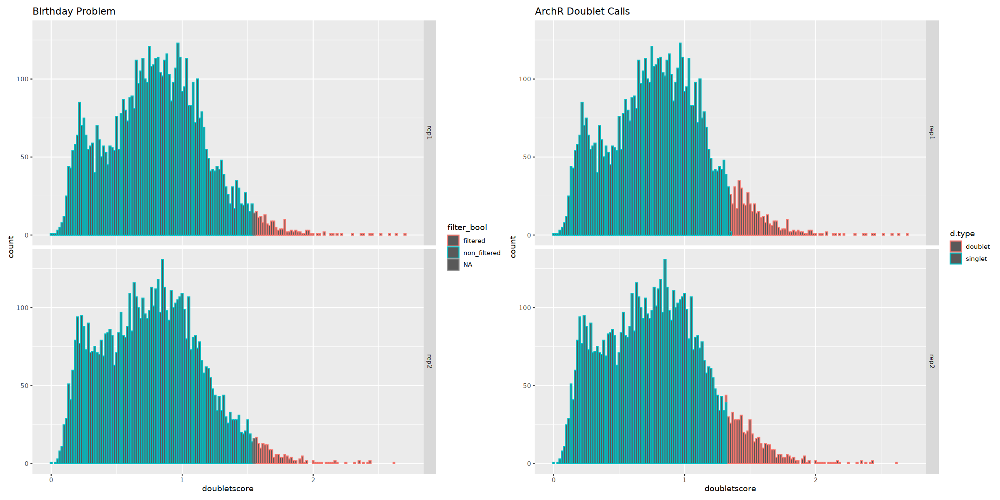

In [399]:
options(repr.plot.width=20, repr.plot.height=10)

birthday_problem_graph + archR_graph_1

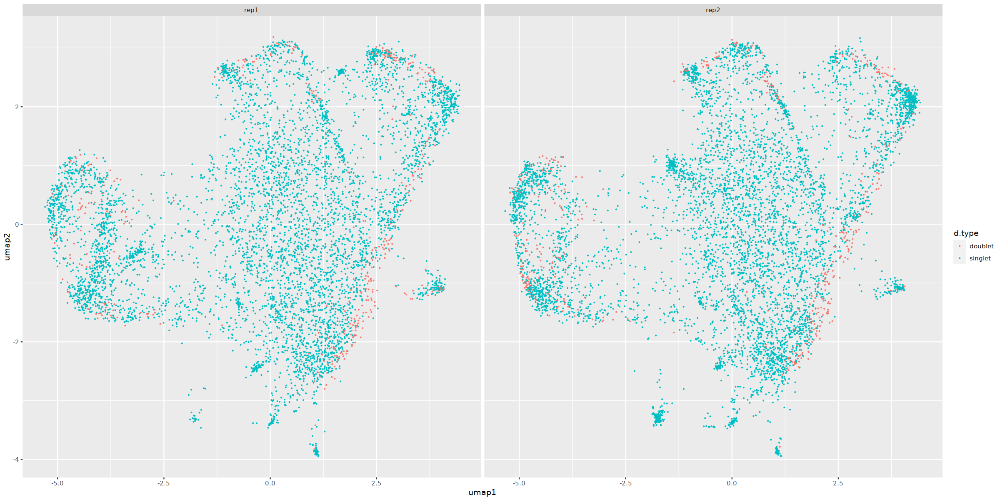

In [400]:
options(repr.plot.width=20, repr.plot.height=10)
ggplot(birthday_problem ,aes(umap1, umap2, color = d.type)) + 
    geom_jitter(size = .1) + facet_grid(.~sampleID)

In [401]:
tfidf.obj.dob.filt.removed <- remove_doublets(tfidf.obj.dob.filt)

   * Doublet filtering * Number cells removed= 971  Filtered: cells = 11747 | peaks = 52333



 - filtering outliers in UMAP manifold (z-score e.thresh = 3) ...

 - creating seurat object for graph-based clustering ...

Warning message:
"Feature names cannot have underscores ('_'), replacing with dashes ('-')"
Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 11526
Number of edges: 576212

Running Louvain algorithm...
Maximum modularity in 100 random starts: 0.8907
Number of communities: 12
Elapsed time: 47 seconds


 - finished graph-based clustering ...

   * removing low quality clusters ...

   * filtering per-cluster outliers (z-score filtDistClst2 = 5) ...

   * total number of cells surviving subcluster filtering = 11451

 - filtering clusters with low cell/read counts ...



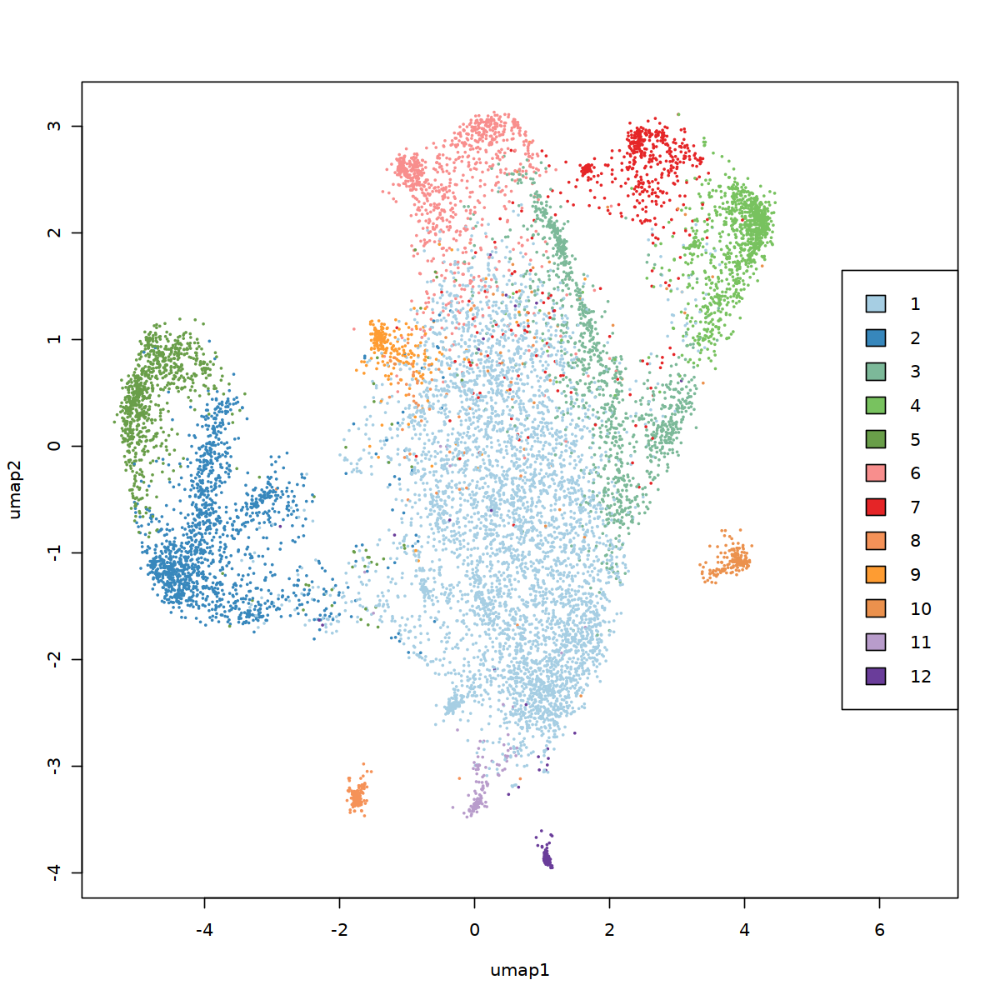

In [402]:
# identify clusters using neighborhood graph -----------------------------
tfidf.obj.dob.filt.clusters <- callClusters(tfidf.obj.dob.filt.removed, 
                        res=.5,
                        verbose=T,
                        svd_slotName= "SVD",
                        cleanCluster=T)

#plot cluster membership on UMAP embedding ------------------------------
options(repr.plot.width=10, repr.plot.height=10)
# NMF
#pdf(paste0(out,".NMF.full.UMAP.clusters.pdf"), width=10, height=10)
plotUMAP(tfidf.obj.dob.filt.clusters, cex=0.3)
#dev.off()



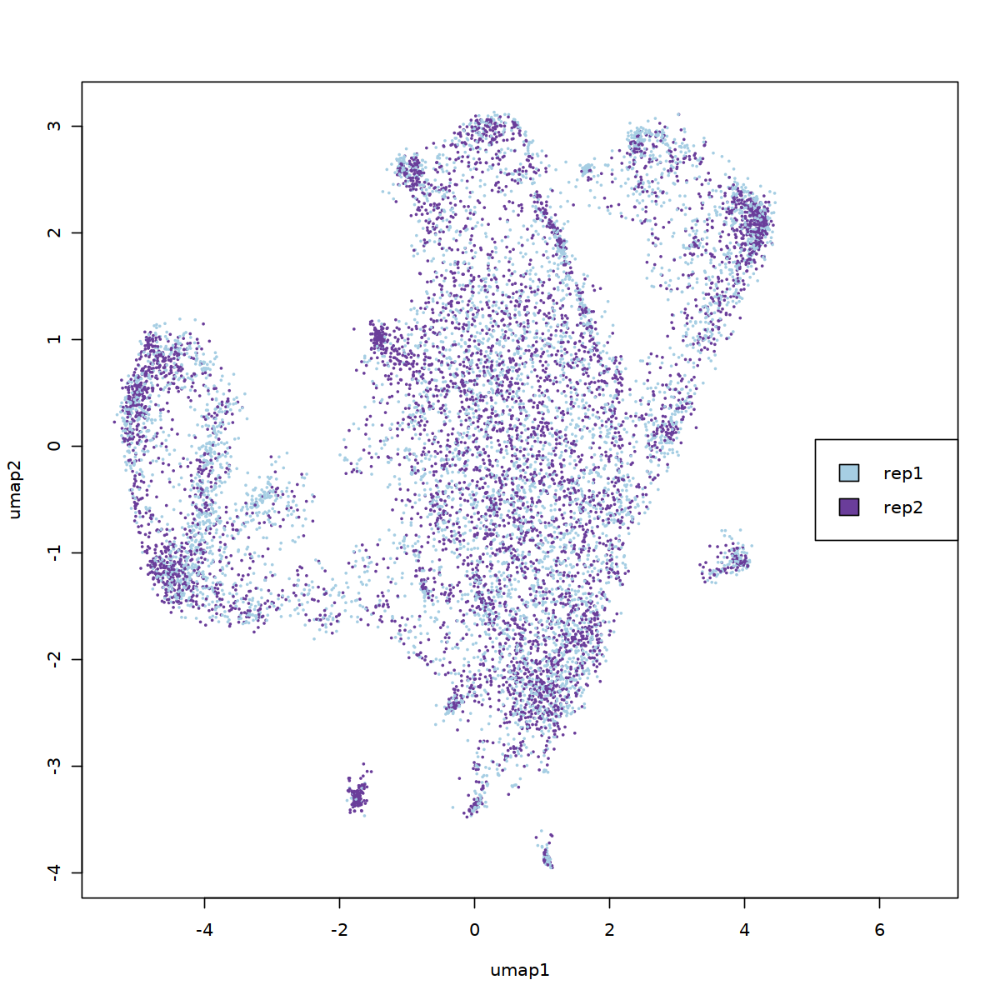

In [403]:
plotUMAP(tfidf.obj.dob.filt.clusters, cex=0.3, column = "sampleID")

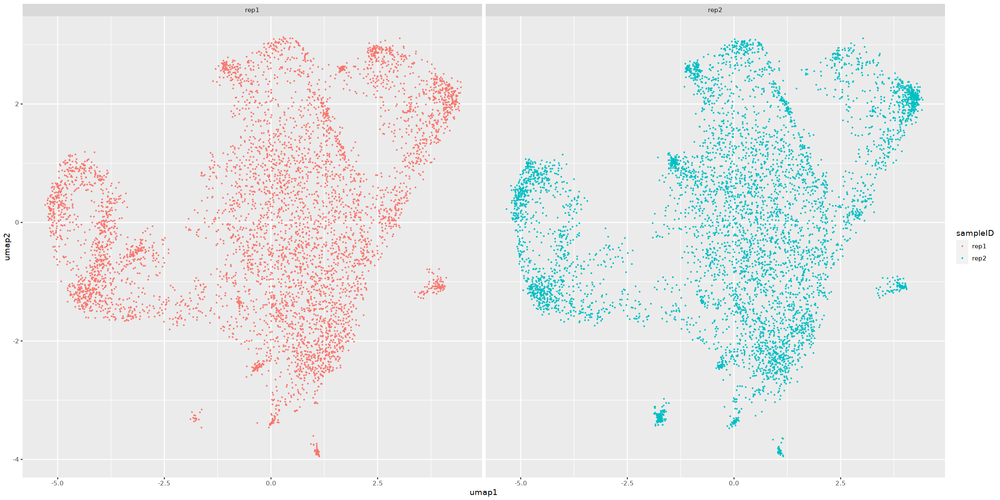

In [404]:
options(repr.plot.width=20, repr.plot.height=10)
cluster_plot <- as_tibble(tfidf.obj.dob.filt.clusters$Clusters)

ggplot(cluster_plot ,aes(umap1, umap2, color = sampleID)) + 
    geom_jitter(size = .1) + facet_grid(.~sampleID)

In [405]:
options(repr.plot.width=20, repr.plot.height=10)
cluster_plot <- as_tibble(tfidf.obj.dob.filt.clusters$Clusters)

read_depth_umap <- ggplot(cluster_plot ,aes(umap1, umap2, color = log(total))) + 
    geom_jitter(size = .1) + facet_grid(.~sampleID) +     scale_color_viridis_c()

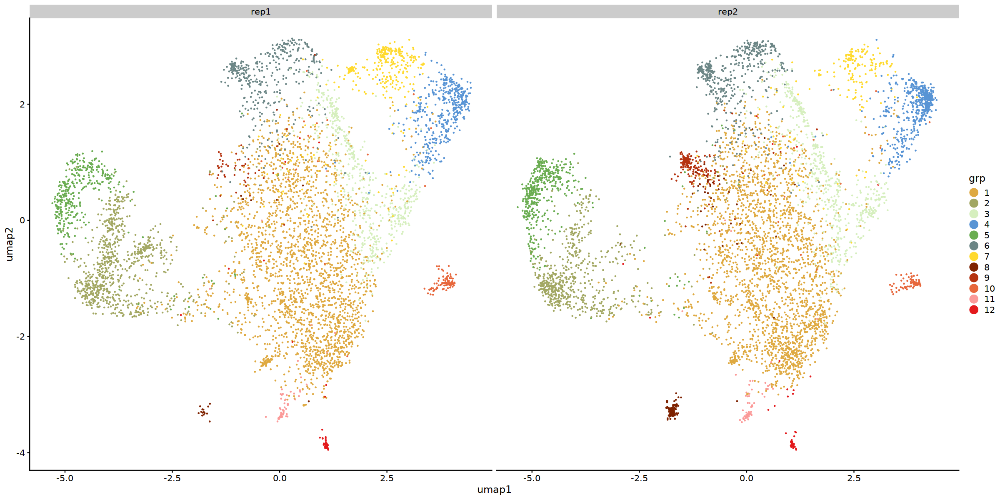

In [406]:
library(cowplot)
umap_cluster_colors <- c("#DEA940","#A2A763","#D6EEBE","#5894D4","#6AAD51","#6C8686","#FFD92F", "#7f2201","#b53310",
                         "#E7673B","#FB9A99","#E31A1C","#FDBF6F","#CAB2D6","#386CB0","#FFFFB3", "#5dead5","#c11577",
                         "#CCCCCC", "#7570B3","#B15928", "#6A3D9A", "#d87c6a", "#0060e8", "#84c5ff", "#ffd460", "#d81397")


col_scale <- scale_colour_manual(name = "grp", values = umap_cluster_colors)


options(repr.plot.width=20, repr.plot.height=10)
cluster_plot <- as_tibble(tfidf.obj.dob.filt.clusters$Clusters)

colored_umap <- ggplot(cluster_plot ,aes(umap1, umap2, color = LouvainClusters)) + 
    col_scale + 
    geom_jitter(size = .1) + facet_grid(.~sampleID) + theme_half_open() +
    guides(colour = guide_legend(override.aes = list(size=5))) +
    geom_point(size = .25, alpha = .8)

colored_umap

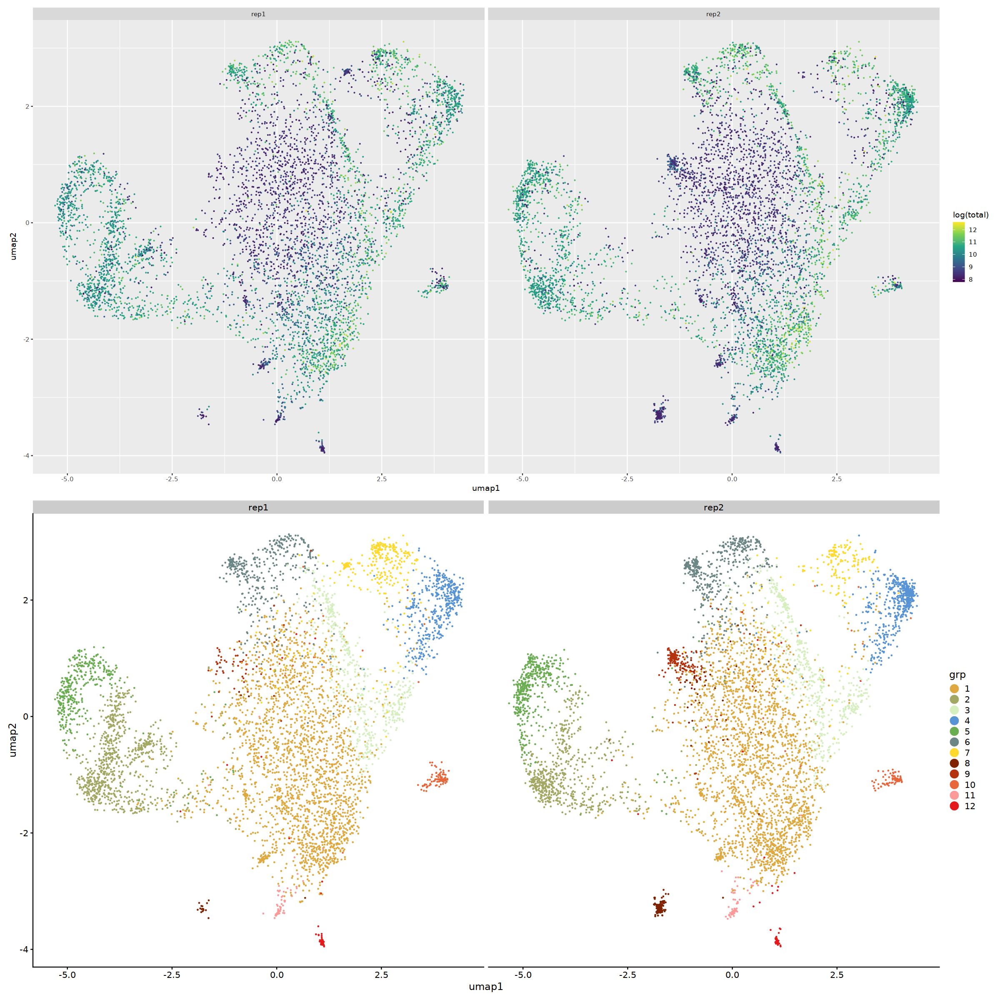

In [407]:
options(repr.plot.width=20, repr.plot.height=20)
read_depth_umap / colored_umap

In [408]:
?colored_umap 

No documentation for 'colored_umap' in specified packages and libraries:
you could try '??colored_umap'

In [ ]:
clusters_by_replicate <- cluster_plot  %>% 
    group_by(LouvainClusters, sampleID)  %>% 
    summarise(counts = n())

clusters_prop <- cluster_plot  %>% 
    group_by(LouvainClusters)  %>% 
    summarise(total_cluster = n())


clusters_full_joined <- full_join(clusters_by_replicate, clusters_prop, by = c("LouvainClusters"))  %>% 
    mutate(prop_cluster = counts/total_cluster)

clusters_full_joined

`summarise()` has grouped output by 'LouvainClusters'. You can override using
the `.groups` argument.


LouvainClusters,sampleID,counts,total_cluster,prop_cluster
<fct>,<chr>,<int>,<int>,<dbl>
1,rep1,2290,4673,0.49004922
1,rep2,2383,4673,0.50995078
2,rep1,825,1446,0.57053942
2,rep2,621,1446,0.42946058
3,rep1,566,1142,0.49562172
3,rep2,576,1142,0.50437828
4,rep1,435,945,0.46031746
4,rep2,510,945,0.53968254
5,rep1,385,858,0.44871795


Warning message:
"Removed 1 rows containing non-finite values (`stat_ydensity()`)."
Warning message:
"Removed 1 rows containing non-finite values (`stat_boxplot()`)."


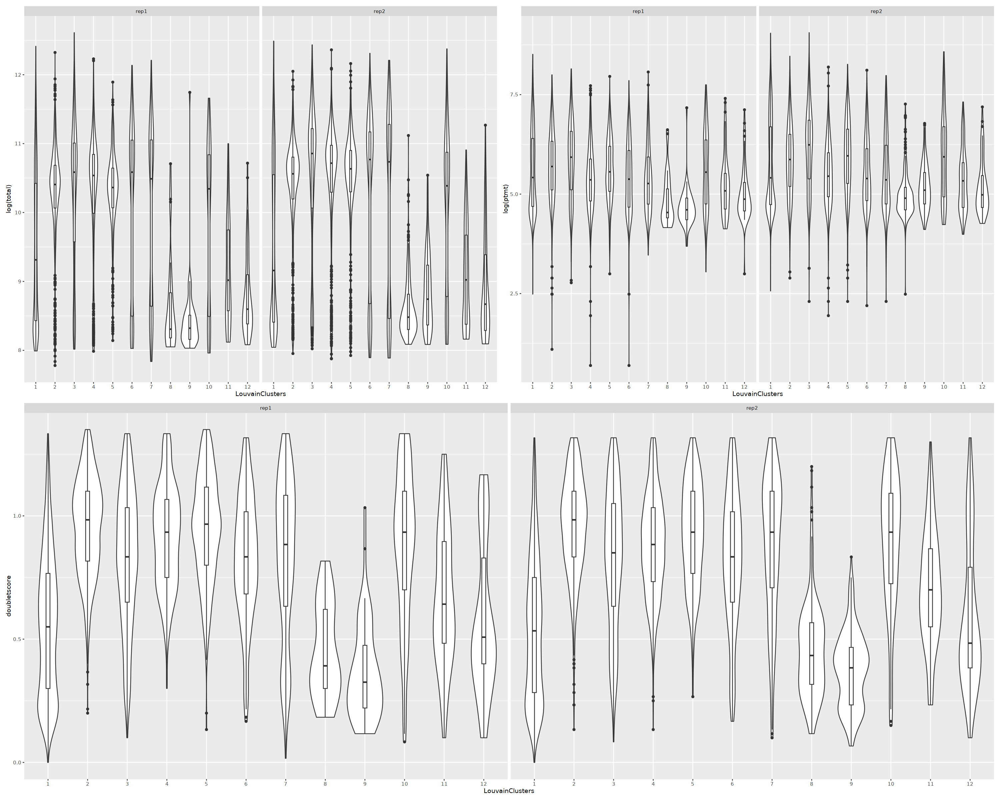

In [411]:
library(patchwork)

options(repr.plot.width=25, repr.plot.height=20)
total <- ggplot(cluster_plot ,aes(x = LouvainClusters, y = log(total))) + 
    geom_violin() + geom_boxplot(width=0.1) + facet_grid(.~sampleID)


ptmt <- ggplot(cluster_plot ,aes(x = LouvainClusters, y = log(ptmt))) + 
    geom_violin() + geom_boxplot(width=0.1) + facet_grid(.~sampleID)

tss <- ggplot(cluster_plot ,aes(x = LouvainClusters, y = tss)) + 
    geom_violin() + geom_boxplot(width=0.1) + facet_grid(.~sampleID)
 

doub <- ggplot(cluster_plot ,aes(x = LouvainClusters, y = doubletscore)) + 
    geom_violin() + geom_boxplot(width=0.1) + facet_grid(.~sampleID)

(total + ptmt) / (doub)

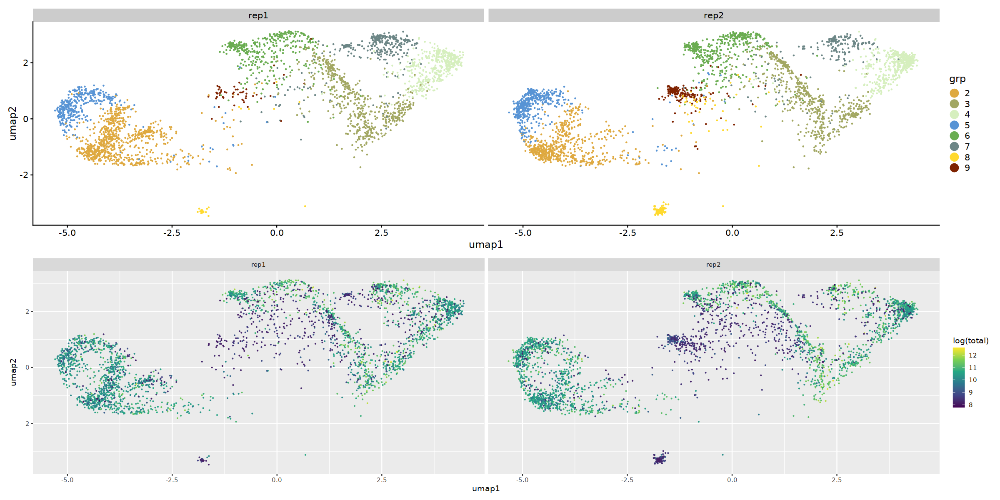

In [423]:
## Filter cells for falling into clusters which appear to be driven by read depth....
`%ni%` <- Negate(`%in%`)
not_in_cluster <- c("1", "10", "11", "12", "13", "14", "15", "16", "17")
clusters_passing <- cluster_plot  %>% 
    dplyr::filter(LouvainClusters %ni% not_in_cluster)


library(cowplot)
umap_cluster_colors <- c("#DEA940","#A2A763","#D6EEBE","#5894D4","#6AAD51","#6C8686","#FFD92F", "#7f2201","#b53310",
                         "#E7673B","#FB9A99","#E31A1C","#FDBF6F","#CAB2D6","#386CB0","#FFFFB3", "#5dead5","#c11577",
                         "#CCCCCC", "#7570B3","#B15928", "#6A3D9A", "#d87c6a", "#0060e8", "#84c5ff", "#ffd460", "#d81397")


col_scale <- scale_colour_manual(name = "grp", values = umap_cluster_colors)


options(repr.plot.width=20, repr.plot.height=10)


colored_umap_filtering <- ggplot(clusters_passing ,aes(umap1, umap2, color = LouvainClusters)) + 
    col_scale + 
    geom_jitter(size = .1) + facet_grid(.~sampleID) + theme_half_open() +
    guides(colour = guide_legend(override.aes = list(size=5))) +
    geom_point(size = .25, alpha = .8)

read_depth_filtering <- ggplot(clusters_passing ,aes(umap1, umap2, color = log(total))) + 
    geom_jitter(size = .1) + facet_grid(.~sampleID) +     scale_color_viridis_c()

colored_umap_filtering/read_depth_filtering

In [237]:
#write.table(clusters_passing, file=paste0(output_location,"Os.cells_passing_umap_embedding", ".SVD.full.metadata.txt"), quote=F, row.names=T, col.names=T, sep="\t")







In [424]:
prefix <- "Os_leaf.merged_replicates"
output_location <- "/scratch/jpm73279/comparative_single_cell/02.QC_clustering/oryza_sativa/clustering/"
#paste0(data_path, prefix,".merged_clusters.sparse")
# output text files
nmf.meta <- tfidf.obj.dob.filt.clusters$Clusters
nmf.rd <- tfidf.obj.dob.filt.clusters$SVD

write.table(nmf.meta, file=paste0(output_location,prefix, ".SVD.full.metadata.txt"), quote=F, row.names=T, col.names=T, sep="\t")
write.table(nmf.rd, file=paste0(output_location, prefix, ".SVD.full.reduced_dimensions.txt"), quote=F, row.names=T, col.names=T, sep="\t")

In [425]:
#Generate Sparse Matrix-
trip <- as.data.frame(summary(tfidf.obj.dob.filt.clusters$counts))
trip$i <- rownames(tfidf.obj.dob.filt.clusters$counts)[trip$i]
trip$j <- colnames(tfidf.obj.dob.filt.clusters$counts)[trip$j]

write.table(trip, file=paste0(output_location, prefix, ".SVD.sparse"), quote=F, row.names=T, col.names=T, sep="\t")

In [241]:
copied_merged_values_updated_clusteing <- merged.obj 

In [245]:
updated_passing_meta <- as.data.frame(clusters_passing)
row.names(updated_passing_meta) <- updated_passing_meta$cellID
head(updated_passing_meta)

,cellID,total,tss,acrs,ptmt,ptmt.ratio,nSites,log10nSites,sampleID,umap1,umap2,doubletscore,d.type,LouvainClusters
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<fct>
CB:Z:CTTGCTGTCAGTGTGT-1-Os.leaf1,CB:Z:CTTGCTGTCAGTGTGT-1-Os.leaf1,299976,106766,120877,2500,0.008334000,105019,5.021268,rep1,-2.583045,0.02587507,0.7500000,singlet,2
CB:Z:CCGTGAGTCTAGCAGT-1-Os.leaf1,CB:Z:CCGTGAGTCTAGCAGT-1-Os.leaf1,261285,102590,131306,2813,0.010766022,83707,4.922762,rep1,-2.456926,-0.02407574,0.8166667,singlet,2
CB:Z:TCACAAGAGAGAACCC-1-Os.leaf1,CB:Z:TCACAAGAGAGAACCC-1-Os.leaf1,246076,95306,114717,3931,0.015974740,85922,4.934104,rep1,-2.213037,0.51601119,1.0000000,singlet,2
CB:Z:TCCAGAAAGCTGATTC-1-Os.leaf1,CB:Z:TCCAGAAAGCTGATTC-1-Os.leaf1,231955,76693,67515,4730,0.020391886,93945,4.972874,rep1,-1.564860,1.60886569,0.7333333,singlet,2
CB:Z:CCCTAACTCATTGCCC-1-Os.leaf1,CB:Z:CCCTAACTCATTGCCC-1-Os.leaf1,223899,84024,102085,1747,0.007802625,78890,4.897022,rep1,-2.610738,-0.01714151,0.7500000,singlet,2
CB:Z:TCCATCGAGGTAGGAA-1-Os.leaf1,CB:Z:TCCATCGAGGTAGGAA-1-Os.leaf1,221615,70669,57683,3577,0.016140604,91184,4.959919,rep1,-2.295737,0.93605883,1.2666667,singlet,2


In [246]:
#Overwrite meta_data for new clustering
copied_merged_values_updated_clusteing$meta <- updated_passing_meta

In [258]:
barcode_array <- updated_passing_meta$cellID

In [259]:
copied_counts <- copied_merged_values_updated_clusteing$counts

In [260]:
filter_indices <- which(colnames(copied_counts) %in% barcode_array)

# Subset the matrix using these indices
filtered_mat <- copied_counts[, filter_indices]

In [263]:
copied_merged_values_updated_clusteing$counts <- filtered_mat

In [264]:
    print("Generating Graphs")
    # estimate log10 number of accessible regions per cell
    cell.counts <- Matrix::colSums(copied_merged_values_updated_clusteing$counts)

    # estimate peak accessibility frequency across cells
    site.freq <- Matrix::rowMeans(copied_merged_values_updated_clusteing$counts)

[1] "Generating Graphs"


Warning message in xy.coords(x, y, xlabel, ylabel, log):
"14 x values <= 0 omitted from logarithmic plot"
Warning message in xy.coords(x, y, xlabel, ylabel, log):
"2 x values <= 0 omitted from logarithmic plot"


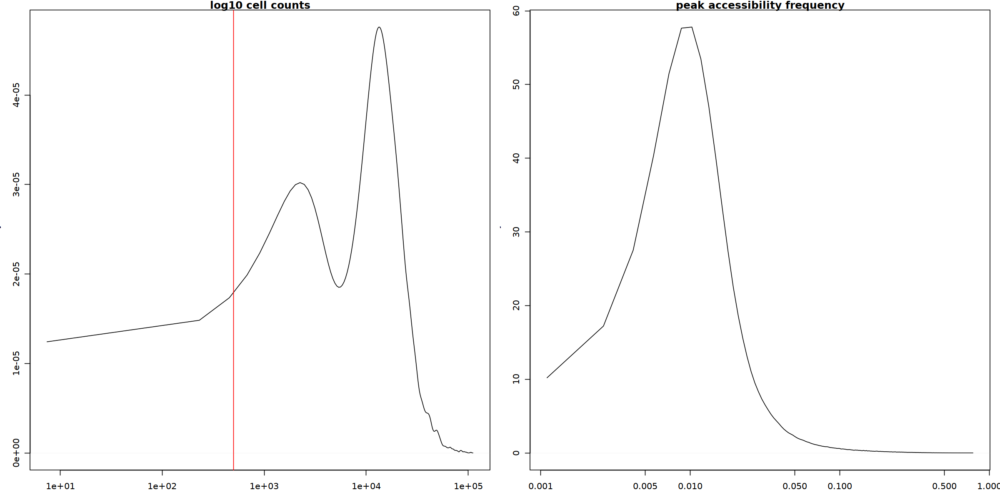

In [265]:
layout(matrix(c(1:2), ncol=2))
par(mar=c(3,3,1,1))
plot(density(cell.counts), main="log10 cell counts", log="x")
abline(v=500, col="red")
plot(density(site.freq), main="peak accessibility frequency", log="x")

In [266]:
site.freq <- Matrix::rowMeans(copied_merged_values_updated_clusteing$counts)

In [314]:
# get per cell feature counts --------------------------------------------
cell.counts <- Matrix::colSums(soc.obj$counts)  # count number of features with Tn5 insertions per cell
cell.counts.z <- as.numeric(scale(cell.counts)) # convert features counts into Z-scores
cell.counts.threshold <- max(c(cell.counts[cell.counts.z < -1], 100)) # minimum feature counts (greater of 1 std or 1000)


# clean sparse counts matrix ---------------------------------------------
copied_merged_values_updated_clusteing.cleaned <- cleanData(copied_merged_values_updated_clusteing, 
                     min.c=100,  # minimum number of accessible features per cell
                     min.t=0.02,  # minimum feature frequency across cells
                     max.t=0.8, # maximum feature frequency across cells
                     verbose=T)

   * Input: cells = 6390 | peaks = 653941

   * Filtered: cells = 5930 | peaks = 37583



In [315]:
# normalize with TFIDF ---------------------------------------------------
copied_merged_values_updated_clusteing.cleaned <- tfidf(copied_merged_values_updated_clusteing.cleaned,
                doL2=T)

In [316]:
# project with NMF -------------------------------------------------------
copied_merged_values_updated_clusteing.cleaned.reduce_dims <- reduceDims(copied_merged_values_updated_clusteing.cleaned,
                      method="SVD", 
                      cor.max=.3,
                      n.pcs=30, 
                      svd_slotName="SVD")


# reduce to 2-dimensions with UMAP ---------------------------------------
copied_merged_values_updated_clusteing.cleaned.reduce_dims <- projectUMAP(copied_merged_values_updated_clusteing.cleaned.reduce_dims, 
                       verbose=T,
                       k.near=25,
                       m.dist=0.01,
                       svd_slotName="SVD")

 - non-linear dimensionality reduction with UMAP ...

14:39:45 UMAP embedding parameters a = 1.896 b = 0.8006

14:39:45 Read 5930 rows and found 28 numeric columns

14:39:45 Using Annoy for neighbor search, n_neighbors = 25

14:39:45 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

14:39:46 Writing NN index file to temp file /tmp/RtmpNCuroq/file1eb4f3b26ba94

14:39:46 Searching Annoy index using 16 threads, search_k = 2500

14:39:46 Annoy recall = 100%

14:39:58 Commencing smooth kNN distance calibration using 16 threads
 with target n_neighbors = 25

14:40:08 Initializing from normalized Laplacian + noise (using irlba)

14:40:09 Commencing optimization for 500 epochs, with 177936 positive edges

14:40:38 Optimization finished



 - filtering outliers in UMAP manifold (z-score e.thresh = 3) ...

 - creating seurat object for graph-based clustering ...

Warning message:
"Feature names cannot have underscores ('_'), replacing with dashes ('-')"
Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 5851
Number of edges: 124512

Running Louvain algorithm...
Maximum modularity in 100 random starts: 0.6457
Number of communities: 8
Elapsed time: 12 seconds


 - finished graph-based clustering ...

   * removing low quality clusters ...

   * filtering per-cluster outliers (z-score filtDistClst2 = 5) ...

   * total number of cells surviving subcluster filtering = 5781

 - filtering clusters with low cell/read counts ...



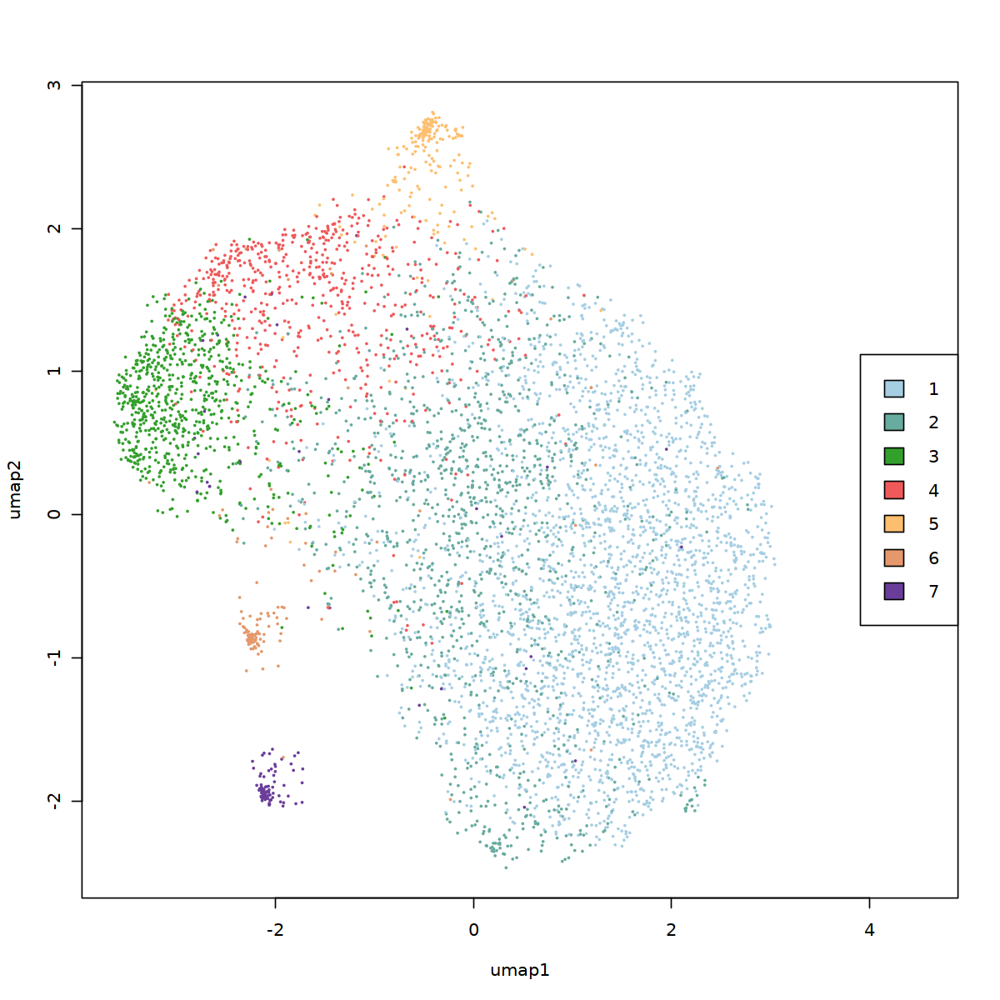

In [317]:
# identify clusters using neighborhood graph -----------------------------
copied_merged_values_updated_clusteing.cleaned.reduce_dims <- callClusters(copied_merged_values_updated_clusteing.cleaned.reduce_dims, 
                        res=1.2,
                        verbose=T,
                        svd_slotName= "SVD",
                        cleanCluster=T)

#plot cluster membership on UMAP embedding ------------------------------
options(repr.plot.width=10, repr.plot.height=10)
# NMF
#pdf(paste0(out,".NMF.full.UMAP.clusters.pdf"), width=10, height=10)
plotUMAP(copied_merged_values_updated_clusteing.cleaned.reduce_dims, cex=0.3)
#dev.off()



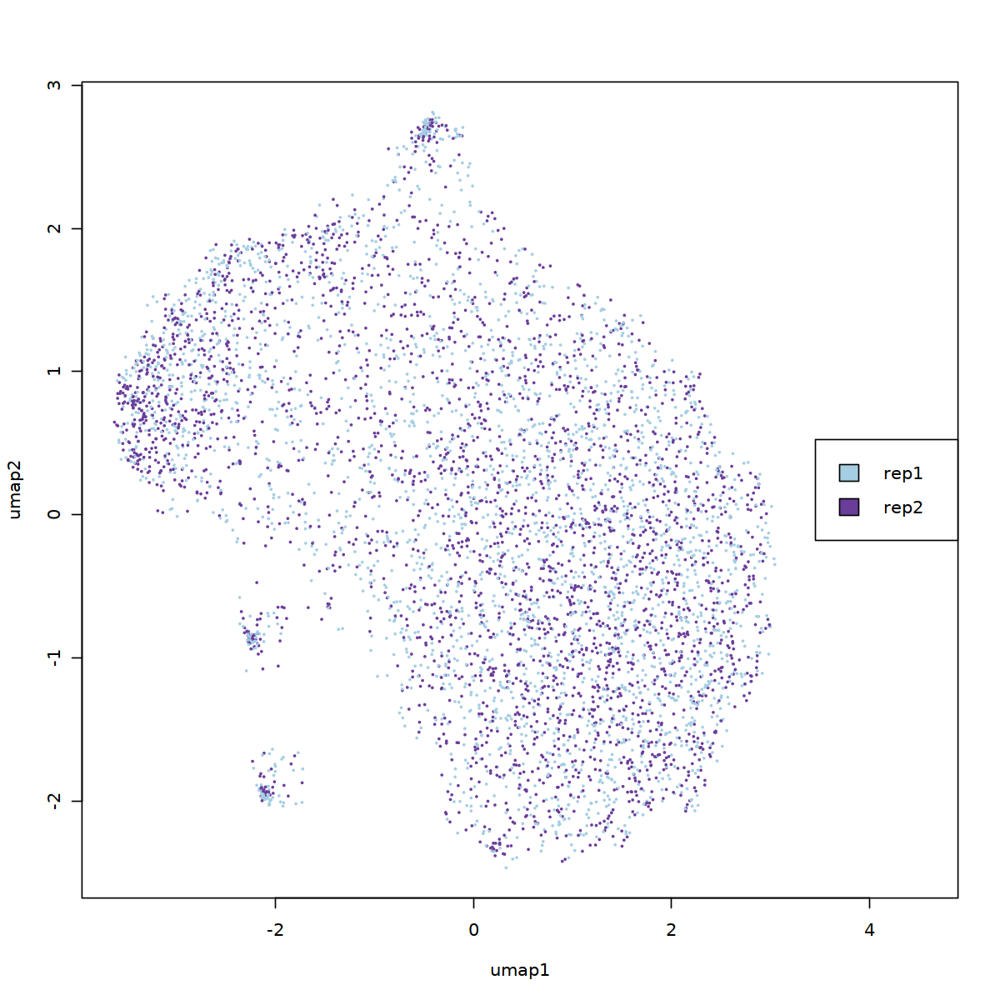

In [318]:
plotUMAP(copied_merged_values_updated_clusteing.cleaned.reduce_dims, cex=0.3, column = "sampleID")

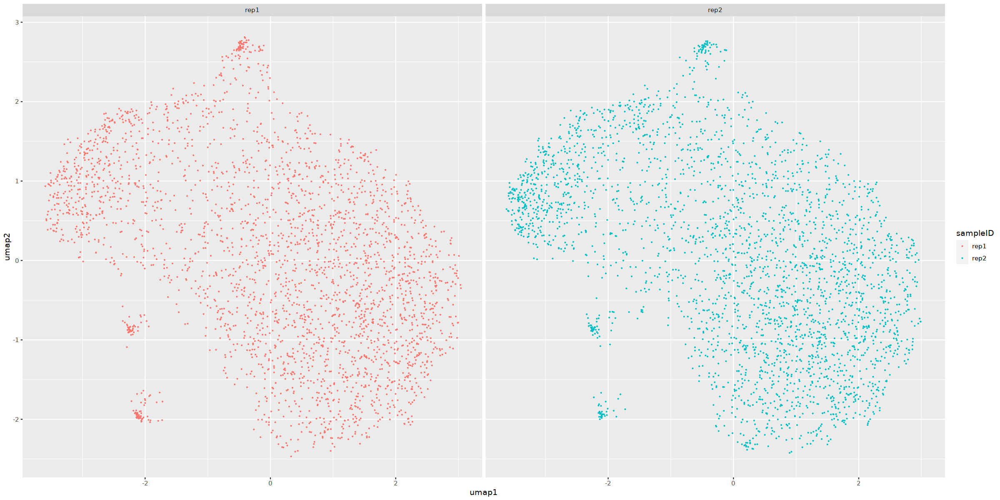

In [319]:
options(repr.plot.width=20, repr.plot.height=10)
cluster_plot <- as_tibble(copied_merged_values_updated_clusteing.cleaned.reduce_dims$Clusters)

ggplot(cluster_plot ,aes(umap1, umap2, color = sampleID)) + 
    geom_jitter(size = .1) + facet_grid(.~sampleID)

In [320]:
head(cluster_plot)

cellID,total,tss,acrs,ptmt,ptmt.ratio,nSites,log10nSites,sampleID,umap1,umap2,doubletscore,d.type,LouvainClusters
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<fct>
CB:Z:CTTGCTGTCAGTGTGT-1-Os.leaf1,299976,106766,120877,2500,0.008334000,105019,5.021268,rep1,-0.0607614,-1.77196139,0.7500000,singlet,2
CB:Z:CCGTGAGTCTAGCAGT-1-Os.leaf1,261285,102590,131306,2813,0.010766022,83707,4.922762,rep1,-2.1259224,-0.01668197,0.8166667,singlet,4
CB:Z:TCACAAGAGAGAACCC-1-Os.leaf1,246076,95306,114717,3931,0.015974740,85922,4.934104,rep1,2.2637593,-0.71413656,1.0000000,singlet,1
CB:Z:TCCAGAAAGCTGATTC-1-Os.leaf1,231955,76693,67515,4730,0.020391886,93945,4.972874,rep1,2.5586048,-0.97832430,0.7333333,singlet,1
CB:Z:CCCTAACTCATTGCCC-1-Os.leaf1,223899,84024,102085,1747,0.007802625,78890,4.897022,rep1,-2.1672699,0.97478217,0.7500000,singlet,2
CB:Z:TCCATCGAGGTAGGAA-1-Os.leaf1,221615,70669,57683,3577,0.016140604,91184,4.959919,rep1,2.4879258,-0.61429696,1.2666667,singlet,1


In [321]:
options(repr.plot.width=20, repr.plot.height=10)
cluster_plot <- as_tibble(copied_merged_values_updated_clusteing.cleaned.reduce_dims$Clusters)

read_depth_umap <- ggplot(cluster_plot ,aes(umap1, umap2, color = log(total))) + 
    geom_jitter(size = .1) + facet_grid(.~sampleID) +     scale_color_viridis_c()

In [322]:
library(cowplot)
umap_cluster_colors <- c("#DEA940","#A2A763","#D6EEBE","#5894D4","#6AAD51","#6C8686","#FFD92F", "#7f2201","#b53310",
                         "#E7673B","#FB9A99","#E31A1C","#FDBF6F","#CAB2D6","#386CB0","#FFFFB3", "#5dead5","#c11577",
                         "#CCCCCC", "#7570B3","#B15928", "#6A3D9A", "#d87c6a", "#0060e8", "#84c5ff", "#ffd460", "#d81397")


col_scale <- scale_colour_manual(name = "grp", values = umap_cluster_colors)


options(repr.plot.width=20, repr.plot.height=10)
cluster_plot <- as_tibble(copied_merged_values_updated_clusteing.cleaned.reduce_dims$Clusters)

colored_umap <- ggplot(cluster_plot ,aes(umap1, umap2, color = LouvainClusters)) + 
    col_scale + 
    geom_jitter(size = .1) + facet_grid(.~sampleID) + theme_half_open() +
    guides(colour = guide_legend(override.aes = list(size=5))) +
    geom_point(size = .25, alpha = .8)


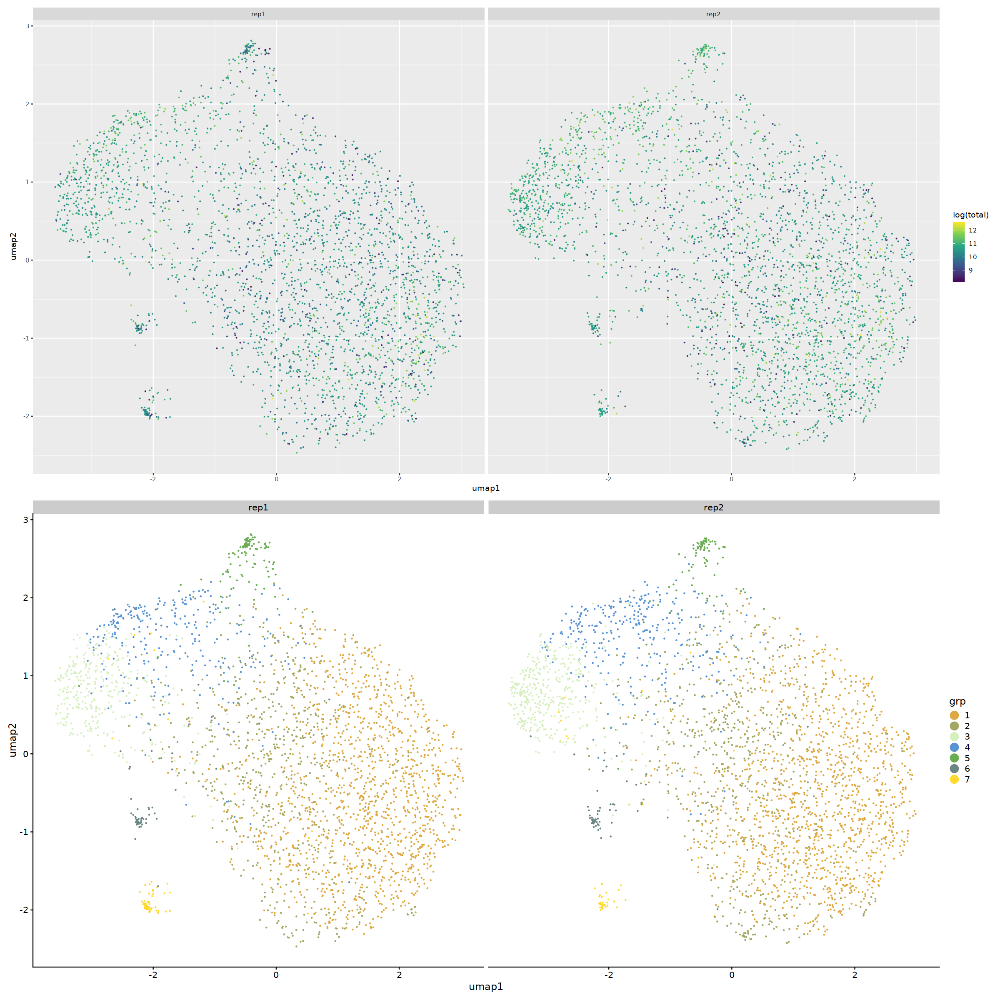

In [323]:
options(repr.plot.width=20, repr.plot.height=20)
read_depth_umap / colored_umap

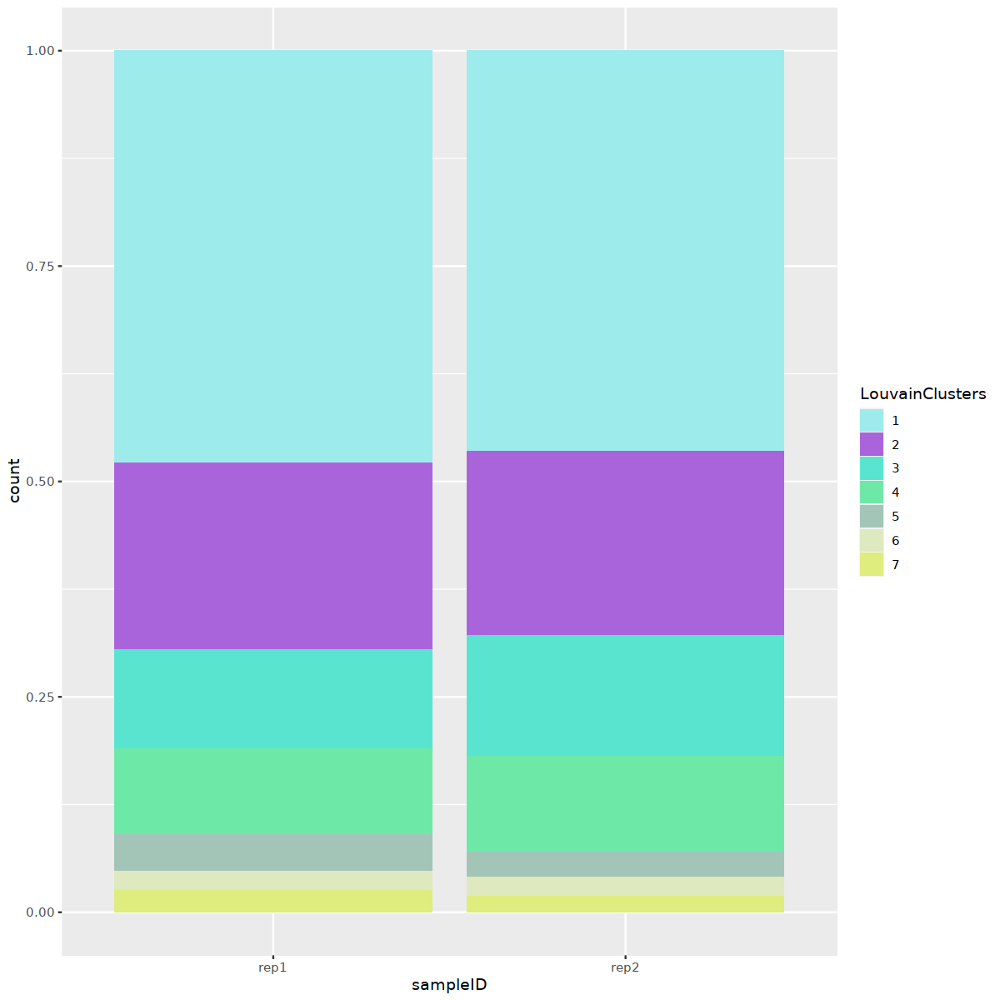

In [324]:

options(repr.plot.width=10, repr.plot.height=10)
library(RColorBrewer)
library(tidyverse)
other <- randomcoloR::distinctColorPalette(k = 41)
#cell_converted_trible <- as_tibble(tfidf.obj.dob.filt.clusters$Clusters)
ggplot(cluster_plot,aes(x = sampleID, fill = LouvainClusters)) + 
    geom_bar(position = "fill") + scale_fill_manual(values=other)


In [325]:
clusters_by_replicate <- cluster_plot  %>% 
    group_by(LouvainClusters, sampleID)  %>% 
    summarise(counts = n())

clusters_prop <- cluster_plot  %>% 
    group_by(LouvainClusters)  %>% 
    summarise(total_cluster = n())


clusters_full_joined <- full_join(clusters_by_replicate, clusters_prop, by = c("LouvainClusters"))  %>% 
    mutate(prop_cluster = counts/total_cluster)

clusters_full_joined

`summarise()` has grouped output by 'LouvainClusters'. You can override using
the `.groups` argument.


LouvainClusters,sampleID,counts,total_cluster,prop_cluster
<fct>,<chr>,<int>,<int>,<dbl>
1,rep1,1369,2727,0.5020169
1,rep2,1358,2727,0.4979831
2,rep1,620,1243,0.4987932
2,rep2,623,1243,0.5012068
3,rep1,330,740,0.4459459
3,rep2,410,740,0.5540541
4,rep1,286,610,0.4688525
4,rep2,324,610,0.5311475
5,rep1,122,207,0.5893720


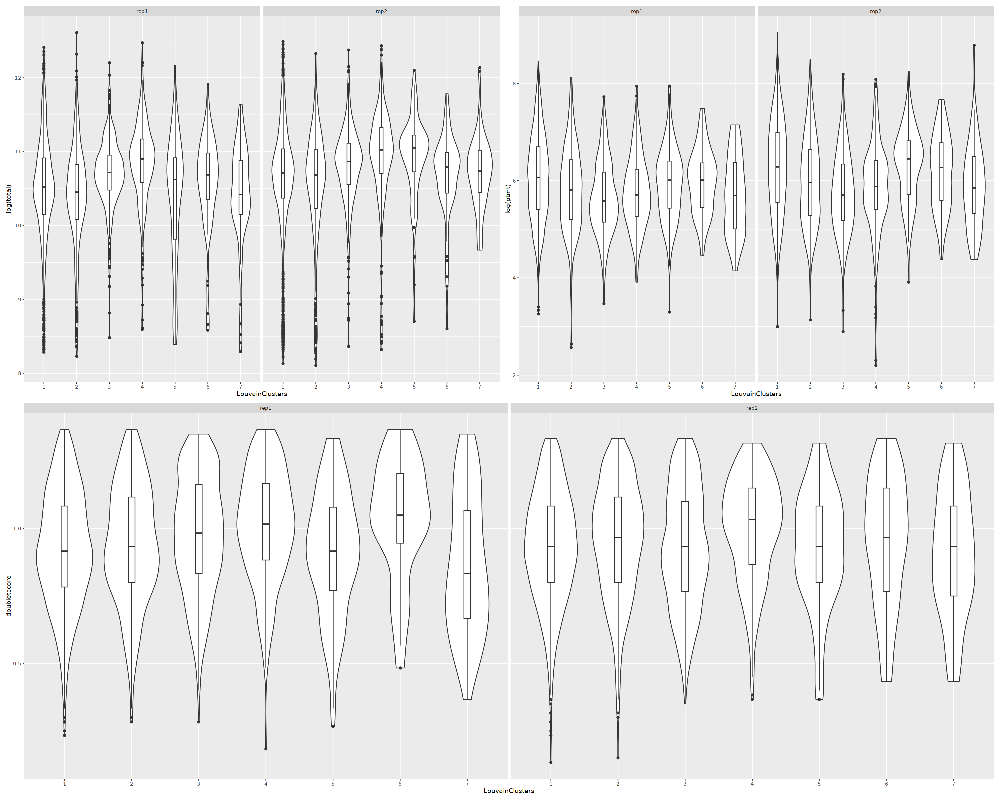

In [326]:
library(patchwork)

options(repr.plot.width=25, repr.plot.height=20)
total <- ggplot(cluster_plot ,aes(x = LouvainClusters, y = log(total))) + 
    geom_violin() + geom_boxplot(width=0.1) + facet_grid(.~sampleID)


ptmt <- ggplot(cluster_plot ,aes(x = LouvainClusters, y = log(ptmt))) + 
    geom_violin() + geom_boxplot(width=0.1) + facet_grid(.~sampleID)

tss <- ggplot(cluster_plot ,aes(x = LouvainClusters, y = tss)) + 
    geom_violin() + geom_boxplot(width=0.1) + facet_grid(.~sampleID)
 

doub <- ggplot(cluster_plot ,aes(x = LouvainClusters, y = doubletscore)) + 
    geom_violin() + geom_boxplot(width=0.1) + facet_grid(.~sampleID)

(total + ptmt) / (doub)

In [327]:
glimpse(updated_passing_meta)

Rows: 6,390
Columns: 14
$ cellID          <chr> "CB:Z:CTTGCTGTCAGTGTGT-1-Os.leaf1", "CB:Z:CCGTGAGTCTAG~
$ total           <dbl> 299976, 261285, 246076, 231955, 223899, 221615, 200703~
$ tss             <dbl> 106766, 102590, 95306, 76693, 84024, 70669, 78348, 846~
$ acrs            <dbl> 120877, 131306, 114717, 67515, 102085, 57683, 112921, ~
$ ptmt            <dbl> 2500, 2813, 3931, 4730, 1747, 3577, 1610, 1866, 916, 2~
$ ptmt.ratio      <dbl> 0.008334000, 0.010766022, 0.015974740, 0.020391886, 0.~
$ nSites          <dbl> 105019, 83707, 85922, 93945, 78890, 91184, 65354, 5636~
$ log10nSites     <dbl> 5.021268, 4.922762, 4.934104, 4.972874, 4.897022, 4.95~
$ sampleID        <chr> "rep1", "rep1", "rep1", "rep1", "rep1", "rep1", "rep1"~
$ umap1           <dbl> -2.583045, -2.456926, -2.213037, -1.564860, -2.610738,~
$ umap2           <dbl> 0.02587507, -0.02407574, 0.51601119, 1.60886569, -0.01~
$ doubletscore    <dbl> 0.7500000, 0.8166667, 1.0000000, 0.7333333, 0.7500000,~
$ d.type        

In [328]:
os_passing_meta <- copied_merged_values_updated_clusteing.cleaned.reduce_dims$Clusters

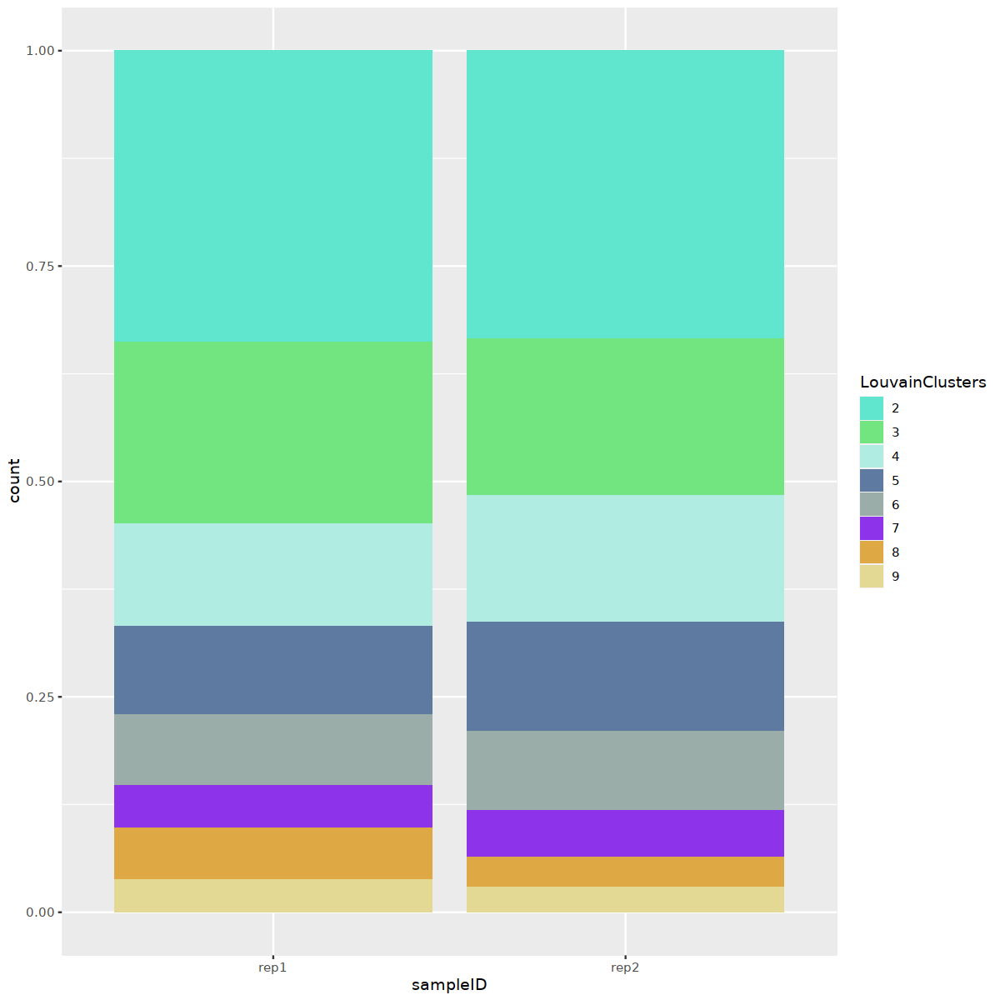

In [329]:

options(repr.plot.width=10, repr.plot.height=10)
library(RColorBrewer)
library(tidyverse)
other <- randomcoloR::distinctColorPalette(k = 41)
#cell_converted_trible <- as_tibble(tfidf.obj.dob.filt.clusters$Clusters)
ggplot(clusters_passing,aes(x = sampleID, fill = LouvainClusters)) + 
    geom_bar(position = "fill") + scale_fill_manual(values=other)


In [297]:
prefix <- "Os_leaf.merged_replicates"
output_location <- "/scratch/jpm73279/comparative_single_cell/02.QC_clustering/oryza_sativa/clustering/"
#paste0(data_path, prefix,".merged_clusters.sparse")
# output text files
nmf.meta <- os_passing_meta
nmf.rd <- copied_merged_values_updated_clusteing.cleaned.reduce_dims$SVD

write.table(nmf.meta, file=paste0(output_location,prefix, ".SVD.full.metadata.txt"), quote=F, row.names=T, col.names=T, sep="\t")
write.table(nmf.rd, file=paste0(output_location, prefix, ".SVD.full.reduced_dimensions.txt"), quote=F, row.names=T, col.names=T, sep="\t")

In [422]:
#Generate Sparse Matrix-
trip <- as.data.frame(summary(tfidf.obj.dob.filt.clusters$counts))
trip$i <- rownames(tfidf.obj.dob.filt.clusters$counts)[trip$i]
trip$j <- colnames(tfidf.obj.dob.filt.clusters$counts)[trip$j]

write.table(trip, file=paste0(output_location, prefix, ".SVD.sparse"), quote=F, row.names=T, col.names=T, sep="\t")

# Running Presto and Cluster Correlation on LCs
## 3/27/2023

In [330]:
library("presto")
run_presto <- function(meta_obj, 
                       meta_slot = "Clusters", 
                       cluster_name = "LouvainClusters", 
                       counts_raw="acr_counts_raw"){
    ### Pull the correct meta datafrom the Socrates Object
    sparse_matrix <- meta_obj[[counts_raw]]
    meta_data <- meta_obj[[meta_slot]]
    
    print(head(as_tibble(meta_data)))
        
    ### Read the Giant Sparse Matrix
    loaded_sparse_matric <- read_delim(sparse_matrix, delim='\t', 
                                       col_names = c("gene_name", "barcode", "accessability"), 
                                       col_types = "ccn")
    
    print(head(loaded_sparse_matric))
    combined_large_w_sparse <- loaded_sparse_matric  %>% 
        filter(gene_name != "Annotation")  %>% 
        dplyr::select(gene_name, barcode, accessability)  %>% 
        left_join(., meta_data, by = c("barcode" = "cellID"))  %>% 
        filter(is.na(!!sym(cluster_name)) != TRUE)  %>% 
        arrange(!!sym(cluster_name))
    
    #order <- combined_large_w_sparse[!!sym(cluster_name)]

    combined_large_w_sparse <- combined_large_w_sparse  %>% 
        dplyr::select(gene_name, barcode, accessability)  %>% 
        mutate(across(accessability, as.numeric))
    
    
    gene_names <- unique(combined_large_w_sparse$gene_name)
    barcodes <- unique(combined_large_w_sparse$barcode)

    combined_large_w_sparse$row <- match(combined_large_w_sparse$gene_name, gene_names)
    combined_large_w_sparse$col <- match(combined_large_w_sparse$barcode, barcodes)


    UIMatrix <- sparseMatrix(i = combined_large_w_sparse$row,
                         j = combined_large_w_sparse$col,
                         x = combined_large_w_sparse$accessability,
                         dimnames=list(gene_names, barcodes))

    print(head(tibble(barcode = unlist(UIMatrix@Dimnames[2]))))
    barcode_tibble <- tibble(barcode = unlist(UIMatrix@Dimnames[2])) %>% 
        left_join(., as_tibble(meta_data), by = c("barcode" = "cellID"))  %>% 
        filter(is.na(total) != TRUE)
    
    print(dim(barcode_tibble))
    print(dim(UIMatrix))
    
    clust_name <- c(cluster_name)
    garbbed_louv_order <- pull(barcode_tibble,!!sym(clust_name))

    sparse_matrix_test <- wilcoxauc(UIMatrix, garbbed_louv_order)
    
    meta_obj[["presto_marker"]] <- sparse_matrix_test
    
    return(meta_obj)
}

In [299]:
library("here")
library(devtools)
library(Seurat)

load_all('/home/jpm73279/Socrates')



# bed <- system.file("extdata", "test.tn5.bed.gz", package = "Socrates")
#ann <- system.file("extdata", "gencode.v19.annotation.gff3.gz", package = "Socrates")
#chr <- system.file("extdata", "hg19.txt", package = "Socrates")
reference_genome_path <- "/home/jpm73279/genome_downloads/Osativa/v7.0/"
#analysis_path <- "/scratch/jpm73279/comparative_single_cell/01.alignments_annotations/Orzchloa_fusca/"
analysis_path <- "/scratch/jpm73279/comparative_single_cell/01.alignments_annotations/oryza_sativa/"


ann <- paste0(reference_genome_path,"annotation/Osativa_323_v7.0.gene.gff3")
chr <- paste0(reference_genome_path,"assembly/Osativa_323_v7.0.chrom.sizes")
Oryza_sat <- "/scratch/jpm73279/comparative_single_cell/01.alignments_annotations/oryza_sativa/Os.combined_reps.sorted.bed"

#Load Object
Os.leaf <- loadBEDandGenomeData(Oryza_sat, ann, chr)


i Loading Socrates
Warning message:
"replacing previous import 'scales::viridis_pal' by 'viridis::viridis_pal' when loading 'Socrates'"
Running pre-check on input files and executable paths ...

BED file path = /scratch/jpm73279/comparative_single_cell/01.alignments_annotations/oryza_sativa/Os.combined_reps.sorted.bed ... ok

GFF file path = /home/jpm73279/genome_downloads/Osativa/v7.0/annotation/Osativa_323_v7.0.gene.gff3 ... ok

Chromosome sizes file path = /home/jpm73279/genome_downloads/Osativa/v7.0/assembly/Osativa_323_v7.0.chrom.sizes ... ok

Macs2 is installed .... ok

 - loading data (this may take obj while for big BED files) ...

 - finished loading data



In [413]:
library(tidyverse)
#os_meta_data <- copied_merged_values_updated_clusteing.cleaned.reduce_dims$meta #<- read_delim("/scratch/jpm73279/comparative_single_cell/02.QC_clustering/oryza_sativa/clustering/Os_leaf.merged_replicates.SVD.full.metadata.txt", skip = 1,
#                           #col_names =  c("row_n",'cellID', 'total', 'tss', 'acrs', 'ptmt', 'nSites', 'log10nSites', 'pTSS', 'FRiP', 'pOrg', 'tss_z', 'acr_z', 'sites_z', 'qc_check', 'background', 'cellbulk', 'is_cell', 'sampleID', 'umap1', 'umap2', 'doubletscore', 'd.type', 'LouvainClusters'))
os_gene_counts <- "/scratch/jpm73279/comparative_single_cell/04.marker_annotation/oryza_sativa/acc_metrics_leaf_clusering/oryza_sativa.gene_body_acc_leaf_clusering.counts.txt" 

Os.leaf$meta <- tfidf.obj.dob.filt.clusters$Clusters
Os.leaf$acr_counts_raw <- os_gene_counts

In [414]:
Os.leaf$row_n <- Os.leaf$cellID

In [415]:
library(presto)
Os.leaf.presto <- run_presto(Os.leaf,
           meta_slot = "meta",
           counts_raw = "acr_counts_raw",
           cluster_name = "LouvainClusters")

# A tibble: 6 x 23
  cellID        total    tss   acrs  ptmt nSites log10nSites  pTSS  FRiP    pOrg
  <chr>         <dbl>  <dbl>  <dbl> <dbl>  <dbl>       <dbl> <dbl> <dbl>   <dbl>
1 CB:Z:CTTGCT~ 299976 106766 120877  2500 105019        5.02 0.356 0.403 0.00833
2 CB:Z:GGTTGC~ 245132  84403  80648  4986  95992        4.98 0.344 0.329 0.0203 
3 CB:Z:TCCAGA~ 231955  76693  67515  4730  93945        4.97 0.331 0.291 0.0204 
4 CB:Z:TCACAA~ 246076  95306 114717  3931  85922        4.93 0.387 0.466 0.0160 
5 CB:Z:TAGCCC~ 211735  73261  65876  4201  84933        4.93 0.346 0.311 0.0198 
6 CB:Z:CCGTGA~ 261285 102590 131306  2813  83707        4.92 0.393 0.503 0.0108 
# i 13 more variables: tss_z <dbl>, acr_z <dbl>, sites_z <dbl>, qc_check <dbl>,
#   background <dbl>, cellbulk <dbl>, is_cell <dbl>, sampleID <chr>,
#   umap1 <dbl>, umap2 <dbl>, doubletscore <dbl>, d.type <chr>,
#   LouvainClusters <fct>
# A tibble: 6 x 3
  gene_name      barcode                          accessability
  <chr>     

In [416]:
marker_list_pm_file <- "/home/jpm73279/genome_downloads/Osativa/v7.0/Rice_markers/Os.markers_from_zm.markers.specified.bed"
marker_list_pm <- read_delim(marker_list_pm_file, delim='\t', 
                                       col_names = c("chr", "start", "stop", "geneID", "gene_name", "cell_type", "tissue"))

Rows: 165 Columns: 7
-- Column specification --------------------------------------------------------
Delimiter: "\t"
chr (5): chr, geneID, gene_name, cell_type, tissue
dbl (2): start, stop

i Use `spec()` to retrieve the full column specification for this data.
i Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [417]:
head(marker_list_pm)

chr,start,stop,geneID,gene_name,cell_type,tissue
<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>
Chr12,17302072,17305326,LOC_Os12g29220,Zm_sweet13a__sweet13b__sweet13c,abaxial_bundle_sheath.phloem_parenchyma,leaf
Chr8,20528291,20535292,LOC_Os08g33050,Zm_kan1,abaxial_domains,leaf;tassel;ear;axillaryBud
Chr6,1962245,1963580,LOC_Os06g04540,Zm_BAF1,axillary_meristem,axillaryBud;leaf;tassel;ear
Chr1,41741159,41744666,LOC_Os01g72020,Zm_tru1,"axillary_meristem_lateral_primordia,basal_comparment_lateral_organs",axillaryBud;leaf;tassel;ear
Chr3,28428503,28430462,LOC_Os03g49880,Zm_tb1,"axillary_meristem_lateral_primordia,stamen_primordia,lower_floral_meristem",axillaryBud;leaf;tassel;ear
Chr4,19564238,19566320,LOC_Os04g32510,Zm_ba2,"axillary_meristem,branch_meristem,peripheral_zone_inflorescence_meristem,spikelet_pair_meristem,spikelet_meristem,upper_floral_meristem,lower_floral_meristem,pistil_primordia,stamen_primordia,provascular_strands,glume_primordia,lemma_primordia,palea_primordia",axillaryBud;leaf;tassel;ear


In [418]:
grabbed_top_marker_per_cluster <- top_markers(Os.leaf.presto$presto_marker, 200)

represented_marker_lst <- list()
for (i in unique(Os.leaf.presto$meta$LouvainClusters)) {
    
    #make_set <- setNames("geneID",i) 
    
    LC_top_genes <- grabbed_top_marker_per_cluster[, c("rank", i)]
    LC_top_genes <- dplyr::rename(LC_top_genes, geneID = as.character(i))
    
    markers_present_in_presto <- left_join(LC_top_genes, 
                                           marker_list_pm, by = c("geneID"))  %>% 
    dplyr::filter(is.na(chr) != TRUE)  %>% 
    dplyr::select(rank, geneID, chr, start, stop, gene_name, cell_type) %>% 
    dplyr::mutate(LC_value = str_c("LC", as.character(i),  sep ="_")) 
    
    represented_marker_lst[[i]] <- markers_present_in_presto
}
                 
represented_marker_lst

rank,geneID,chr,start,stop,gene_name,cell_type,LC_value
<int>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>
81,LOC_Os01g07500,Chr1,3577465,3581859,Zm_vt2,"epidermis,provascular_strands,",LC_3
124,LOC_Os01g09320,Chr1,4738904,4744591,Zm_me3,bundle_sheath,LC_3
rank,geneID,chr,start,stop,gene_name,cell_type,LC_value
<int>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>
98,LOC_Os01g68000,Chr1,39523637,39527227,Zm_te1,"peripheral_zone_SAM,axillary_meristem,provascular_strands,proximal_meristem",LC_1
rank,geneID,chr,start,stop,gene_name,cell_type,LC_value
<int>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>
94,LOC_Os09g25850,Chr9,15492997,15497524,Zm_gl1,epidermis,LC_7
110,LOC_Os01g07500,Chr1,3577465,3581859,Zm_vt2,"epidermis,provascular_strands,",LC_7


In [419]:
gathered_markers <- bind_rows(represented_marker_lst)  %>% 
    arrange(LC_value, rank)

gathered_markers

rank,geneID,chr,start,stop,gene_name,cell_type,LC_value
<int>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>
98,LOC_Os01g68000,Chr1,39523637,39527227,Zm_te1,"peripheral_zone_SAM,axillary_meristem,provascular_strands,proximal_meristem",LC_1
75,LOC_Os01g45990,Chr1,26119707,26126165,Zm_kch1,subsidiary_cell,LC_10
197,LOC_Os11g01130,Chr11,68343,70989,Zm_ns2_ortho_count_2,"leaf_primordia_meristem,L1_pistil_primordia,L1_stamen_primordia,L1_palea_primordia,L1_lemma_primordia,L1_glume_primordia",LC_12
10,LOC_Os12g19381,Chr12,11262562,11278448,Zm_ssu2_ortho_count_3__ssu1_ortho_count_3,bundle_sheath,LC_2
14,LOC_Os11g47970,Chr11,28934293,28936340,Zm_rca1,bundle_sheath,LC_2
19,LOC_Os12g19470,Chr12,11320266,11322547,Zm_ssu2_ortho_count_1__ssu1_ortho_count_1,bundle_sheath,LC_2
55,LOC_Os01g45274,Chr1,25692716,25705090,Zm_cah6,mesophyll,LC_2
62,LOC_Os12g17600,Chr12,10080397,10081661,Zm_ssu2_ortho_count_2__ssu1_ortho_count_2,bundle_sheath,LC_2
81,LOC_Os01g07500,Chr1,3577465,3581859,Zm_vt2,"epidermis,provascular_strands,",LC_3


In [330]:
library("presto")
run_presto <- function(meta_obj, 
                       meta_slot = "Clusters", 
                       cluster_name = "LouvainClusters", 
                       counts_raw="acr_counts_raw"){
    ### Pull the correct meta datafrom the Socrates Object
    sparse_matrix <- meta_obj[[counts_raw]]
    meta_data <- meta_obj[[meta_slot]]
    
    print(head(as_tibble(meta_data)))
        
    ### Read the Giant Sparse Matrix
    loaded_sparse_matric <- read_delim(sparse_matrix, delim='\t', 
                                       col_names = c("gene_name", "barcode", "accessability"), 
                                       col_types = "ccn")
    
    print(head(loaded_sparse_matric))
    combined_large_w_sparse <- loaded_sparse_matric  %>% 
        filter(gene_name != "Annotation")  %>% 
        dplyr::select(gene_name, barcode, accessability)  %>% 
        left_join(., meta_data, by = c("barcode" = "cellID"))  %>% 
        filter(is.na(!!sym(cluster_name)) != TRUE)  %>% 
        arrange(!!sym(cluster_name))
    
    #order <- combined_large_w_sparse[!!sym(cluster_name)]

    combined_large_w_sparse <- combined_large_w_sparse  %>% 
        dplyr::select(gene_name, barcode, accessability)  %>% 
        mutate(across(accessability, as.numeric))
    
    
    gene_names <- unique(combined_large_w_sparse$gene_name)
    barcodes <- unique(combined_large_w_sparse$barcode)

    combined_large_w_sparse$row <- match(combined_large_w_sparse$gene_name, gene_names)
    combined_large_w_sparse$col <- match(combined_large_w_sparse$barcode, barcodes)


    UIMatrix <- sparseMatrix(i = combined_large_w_sparse$row,
                         j = combined_large_w_sparse$col,
                         x = combined_large_w_sparse$accessability,
                         dimnames=list(gene_names, barcodes))

    print(head(tibble(barcode = unlist(UIMatrix@Dimnames[2]))))
    barcode_tibble <- tibble(barcode = unlist(UIMatrix@Dimnames[2])) %>% 
        left_join(., as_tibble(meta_data), by = c("barcode" = "cellID"))  %>% 
        filter(is.na(total) != TRUE)
    
    print(dim(barcode_tibble))
    print(dim(UIMatrix))
    
    clust_name <- c(cluster_name)
    garbbed_louv_order <- pull(barcode_tibble,!!sym(clust_name))

    sparse_matrix_test <- wilcoxauc(UIMatrix, garbbed_louv_order)
    
    meta_obj[["presto_marker"]] <- sparse_matrix_test
    
    return(meta_obj)
}

In [299]:
library("here")
library(devtools)
library(Seurat)

load_all('/home/jpm73279/Socrates')



# bed <- system.file("extdata", "test.tn5.bed.gz", package = "Socrates")
#ann <- system.file("extdata", "gencode.v19.annotation.gff3.gz", package = "Socrates")
#chr <- system.file("extdata", "hg19.txt", package = "Socrates")
reference_genome_path <- "/home/jpm73279/genome_downloads/Osativa/v7.0/"
#analysis_path <- "/scratch/jpm73279/comparative_single_cell/01.alignments_annotations/Orzchloa_fusca/"
analysis_path <- "/scratch/jpm73279/comparative_single_cell/01.alignments_annotations/oryza_sativa/"


ann <- paste0(reference_genome_path,"annotation/Osativa_323_v7.0.gene.gff3")
chr <- paste0(reference_genome_path,"assembly/Osativa_323_v7.0.chrom.sizes")
Oryza_sat <- "/scratch/jpm73279/comparative_single_cell/01.alignments_annotations/oryza_sativa/Os.combined_reps.sorted.bed"

#Load Object
Os.leaf <- loadBEDandGenomeData(Oryza_sat, ann, chr)


i Loading Socrates
Warning message:
"replacing previous import 'scales::viridis_pal' by 'viridis::viridis_pal' when loading 'Socrates'"
Running pre-check on input files and executable paths ...

BED file path = /scratch/jpm73279/comparative_single_cell/01.alignments_annotations/oryza_sativa/Os.combined_reps.sorted.bed ... ok

GFF file path = /home/jpm73279/genome_downloads/Osativa/v7.0/annotation/Osativa_323_v7.0.gene.gff3 ... ok

Chromosome sizes file path = /home/jpm73279/genome_downloads/Osativa/v7.0/assembly/Osativa_323_v7.0.chrom.sizes ... ok

Macs2 is installed .... ok

 - loading data (this may take obj while for big BED files) ...

 - finished loading data



In [413]:
library(tidyverse)
#os_meta_data <- copied_merged_values_updated_clusteing.cleaned.reduce_dims$meta #<- read_delim("/scratch/jpm73279/comparative_single_cell/02.QC_clustering/oryza_sativa/clustering/Os_leaf.merged_replicates.SVD.full.metadata.txt", skip = 1,
#                           #col_names =  c("row_n",'cellID', 'total', 'tss', 'acrs', 'ptmt', 'nSites', 'log10nSites', 'pTSS', 'FRiP', 'pOrg', 'tss_z', 'acr_z', 'sites_z', 'qc_check', 'background', 'cellbulk', 'is_cell', 'sampleID', 'umap1', 'umap2', 'doubletscore', 'd.type', 'LouvainClusters'))
os_gene_counts <- "/scratch/jpm73279/comparative_single_cell/04.marker_annotation/oryza_sativa/acc_metrics_leaf_clusering/oryza_sativa.gene_body_acc_leaf_clusering.counts.txt" 

Os.leaf$meta <- tfidf.obj.dob.filt.clusters$Clusters
Os.leaf$acr_counts_raw <- os_gene_counts

In [414]:
Os.leaf$row_n <- Os.leaf$cellID

In [415]:
library(presto)
Os.leaf.presto <- run_presto(Os.leaf,
           meta_slot = "meta",
           counts_raw = "acr_counts_raw",
           cluster_name = "LouvainClusters")

# A tibble: 6 x 23
  cellID        total    tss   acrs  ptmt nSites log10nSites  pTSS  FRiP    pOrg
  <chr>         <dbl>  <dbl>  <dbl> <dbl>  <dbl>       <dbl> <dbl> <dbl>   <dbl>
1 CB:Z:CTTGCT~ 299976 106766 120877  2500 105019        5.02 0.356 0.403 0.00833
2 CB:Z:GGTTGC~ 245132  84403  80648  4986  95992        4.98 0.344 0.329 0.0203 
3 CB:Z:TCCAGA~ 231955  76693  67515  4730  93945        4.97 0.331 0.291 0.0204 
4 CB:Z:TCACAA~ 246076  95306 114717  3931  85922        4.93 0.387 0.466 0.0160 
5 CB:Z:TAGCCC~ 211735  73261  65876  4201  84933        4.93 0.346 0.311 0.0198 
6 CB:Z:CCGTGA~ 261285 102590 131306  2813  83707        4.92 0.393 0.503 0.0108 
# i 13 more variables: tss_z <dbl>, acr_z <dbl>, sites_z <dbl>, qc_check <dbl>,
#   background <dbl>, cellbulk <dbl>, is_cell <dbl>, sampleID <chr>,
#   umap1 <dbl>, umap2 <dbl>, doubletscore <dbl>, d.type <chr>,
#   LouvainClusters <fct>
# A tibble: 6 x 3
  gene_name      barcode                          accessability
  <chr>     

In [420]:
library(edgeR)
library(preprocessCore)
devtools::load_all('/home/jpm73279/software/preprocessCore')
library("edgeR")

marker_correlation <- function(meta_obj, 
                       meta_slot = "Clusters", 
                       cluster_name = "LouvainClusters", 
                       counts_raw="acr_counts_raw"){
   
    
    ### Pull the correct meta datafrom the Socrates Object
    sparse_matrix <- meta_obj[[counts_raw]]
    meta_data <- meta_obj[[meta_slot]]
    
    print(head(as_tibble(meta_data)))
        
    
    raw_cpm_counts_all_genes <- read_delim(sparse_matrix, delim="\t", col_names = c("gene_name", "barcode", "accessability")) %>%
        dplyr::mutate(cellID = barcode)  %>%
        dplyr::mutate(geneID = gene_name)

    merged_meta_cpm_information <- left_join(meta_data, raw_cpm_counts_all_genes, by = c("cellID"))  %>%
    #mutate(safe_cluster_name = str_c("Louvain_C", LouvainClusters, sep ="_"))  %>%
    #dplyr::select(-LouvainClusters)  %>%
        group_by(!!sym(cluster_name), geneID)  %>%
        summarise(counts = sum(accessability, na.rm = TRUE))

    ### Alt CPM Calc
    merged_meta_cpm_information_copied <- merged_meta_cpm_information
    catch <- merged_meta_cpm_information_copied  %>%
        group_by(!!sym(cluster_name)) %>%
        group_map(~(cpm(.x$counts, log = FALSE, group = .f)), .keep = TRUE)  %>%
        unlist()


    caught_values <- as_tibble(catch)

    see <- ungroup(merged_meta_cpm_information_copied)
    idk <- bind_cols(merged_meta_cpm_information_copied,caught_values)  
    print(head(idk))
    
    merged_meta_cpm_information_copied<- bind_cols(merged_meta_cpm_information_copied,caught_values)  %>% 
        ungroup()  %>% 
        dplyr::rename(grouped_CPM = value)  %>% 
        dplyr::group_by(!!sym(cluster_name)) %>%  
        dplyr::mutate(log_cpm  = log(grouped_CPM))


    #Apply quantile normalization
    merged_meta.quant_norm <- merged_meta_cpm_information_copied  %>% 
        group_by(!!sym(cluster_name))  %>% 
        group_map(~(preprocessCore::normalize.quantiles(data.matrix(.x$grouped_CPM), copy = FALSE)), .keep = TRUE)  %>% 
        unlist()

    zm.quantile_normalized <- as_tibble(merged_meta.quant_norm)  %>% 
        dplyr::rename("quant_norm_cpm" = value)


    merged_meta_cpm_information_copied <- bind_cols(merged_meta_cpm_information_copied, zm.quantile_normalized)

    cell_type_accessability <- merged_meta_cpm_information_copied  %>% 
        dplyr::ungroup()  %>% 
        dplyr::select(!!sym(cluster_name), geneID, quant_norm_cpm)  %>% 
        pivot_wider(names_from = !!sym(cluster_name), values_from = quant_norm_cpm, values_fill = 0)
    
    meta_obj[["corr_matrix"]] <- cell_type_accessability
    
    return(meta_obj)
}


i Loading preprocessCore


In [421]:
Proso_millet.leaf.corr <- marker_correlation(Os.leaf.presto,
           meta_slot = "meta",
           counts_raw = "acr_counts_raw",
           cluster_name = "LouvainClusters")

library(modelr)
combined_louvain_clusters <- as_tibble(Os.leaf.presto$corr_matrix) %>%
    pivot_longer(!geneID, names_to = "cluster_name", values_to = "score")  %>% 
    group_by(geneID)  %>% 
      summarize(mean = mean(score),
            var = var(score))

regression <- loess(var ~ mean, data=combined_louvain_clusters)

combined_louvain_clusters.final <- combined_louvain_clusters %>% 
    add_residuals(regression)  %>% 
    arrange(resid, desc = FALSE)  %>% 
    top_n(500)

options(repr.plot.width=10, repr.plot.height=10)
corr_matrix <- Proso_millet.leaf.corr$corr_matrix

viz_matrix <- as_tibble(corr_matrix)  %>% 
    dplyr::filter(geneID %in% combined_louvain_clusters.final$geneID)  %>% 
    dplyr::select(-geneID)

Lc_corr_matrix <- cor(data.matrix(viz_matrix))

suppressPackageStartupMessages(library(ComplexHeatmap))
library(ComplexHeatmap)
Heatmap(Lc_corr_matrix)

# A tibble: 6 x 23
  cellID        total    tss   acrs  ptmt nSites log10nSites  pTSS  FRiP    pOrg
  <chr>         <dbl>  <dbl>  <dbl> <dbl>  <dbl>       <dbl> <dbl> <dbl>   <dbl>
1 CB:Z:CTTGCT~ 299976 106766 120877  2500 105019        5.02 0.356 0.403 0.00833
2 CB:Z:GGTTGC~ 245132  84403  80648  4986  95992        4.98 0.344 0.329 0.0203 
3 CB:Z:TCCAGA~ 231955  76693  67515  4730  93945        4.97 0.331 0.291 0.0204 
4 CB:Z:TCACAA~ 246076  95306 114717  3931  85922        4.93 0.387 0.466 0.0160 
5 CB:Z:TAGCCC~ 211735  73261  65876  4201  84933        4.93 0.346 0.311 0.0198 
6 CB:Z:CCGTGA~ 261285 102590 131306  2813  83707        4.92 0.393 0.503 0.0108 
# i 13 more variables: tss_z <dbl>, acr_z <dbl>, sites_z <dbl>, qc_check <dbl>,
#   background <dbl>, cellbulk <dbl>, is_cell <dbl>, sampleID <chr>,
#   umap1 <dbl>, umap2 <dbl>, doubletscore <dbl>, d.type <chr>,
#   LouvainClusters <fct>


Rows: 102767261 Columns: 3
-- Column specification --------------------------------------------------------
Delimiter: "\t"
chr (2): gene_name, barcode
dbl (1): accessability

i Use `spec()` to retrieve the full column specification for this data.
i Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'LouvainClusters'. You can override using
the `.groups` argument.


# A tibble: 6 x 4
# Groups:   LouvainClusters [1]
  LouvainClusters geneID                counts  value
  <fct>           <chr>                  <dbl>  <dbl>
1 1               ChrSy.fgenesh.gene.1     266  4.08 
2 1               ChrSy.fgenesh.gene.17     27  0.414
3 1               ChrSy.fgenesh.gene.18    917 14.0  
4 1               ChrSy.fgenesh.gene.19    790 12.1  
5 1               ChrSy.fgenesh.gene.2     618  9.47 
6 1               ChrSy.fgenesh.gene.20    368  5.64 


ERROR: [1m[33mError[39m in `pivot_longer()`:[22m
[33m![39m Can't subset columns that don't exist.
[31mx[39m Column `geneID` doesn't exist.


In [ ]:
grabbed_top_marker_per_cluster[c("rank", "7")]

In [ ]:
represented_marker_lst